## Auto Spelling Correction

**In this Notebook we will go through the process of spelling correction using different NLP models**

In [1]:
pip install numpy

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install seaborn

  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)
Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install tqdm

  Using cached tqdm-4.67.1-py3-none-any.whl.metadata (57 kB)
Using cached tqdm-4.67.1-py3-none-any.whl (78 kB)
Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install wordcloud 

Note: you may need to restart the kernel to use updated packages.


In [7]:
pip install keras

  Using cached keras-3.9.2-py3-none-any.whl.metadata (6.1 kB)
  Using cached rich-14.0.0-py3-none-any.whl.metadata (18 kB)
  Using cached namex-0.0.9-py3-none-any.whl.metadata (322 bytes)
  Using cached h5py-3.13.0-cp310-cp310-win_amd64.whl.metadata (2.5 kB)
  Using cached markdown_it_py-3.0.0-py3-none-any.whl.metadata (6.9 kB)
  Using cached mdurl-0.1.2-py3-none-any.whl.metadata (1.6 kB)
Using cached keras-3.9.2-py3-none-any.whl (1.3 MB)
Using cached h5py-3.13.0-cp310-cp310-win_amd64.whl (3.0 MB)
Using cached namex-0.0.9-py3-none-any.whl (5.8 kB)
Using cached rich-14.0.0-py3-none-any.whl (243 kB)
Using cached markdown_it_py-3.0.0-py3-none-any.whl (87 kB)
Using cached mdurl-0.1.2-py3-none-any.whl (10.0 kB)

   ----- ---------------------------------- 1/7 [optree]
   ----- ---------------------------------- 1/7 [optree]
   ----- ---------------------------------- 1/7 [optree]
   ----------- ---------------------------- 2/7 [mdurl]
   ----------------- ---------------------- 3/7 [h5py]
 

In [8]:
pip install nltk

  Using cached nltk-3.9.1-py3-none-any.whl.metadata (2.9 kB)
  Using cached click-8.1.8-py3-none-any.whl.metadata (2.3 kB)
Using cached nltk-3.9.1-py3-none-any.whl (1.5 MB)
Using cached click-8.1.8-py3-none-any.whl (98 kB)

   ---------------------------------------- 0/3 [regex]
   ---------------------------------------- 0/3 [regex]
   ------------- -------------------------- 1/3 [click]
   ------------- -------------------------- 1/3 [click]
   ------------- -------------------------- 1/3 [click]
   -------------------------- ------------- 2/3 [nltk]
   -------------------------- ------------- 2/3 [nltk]
   -------------------------- ------------- 2/3 [nltk]
   -------------------------- ------------- 2/3 [nltk]
   -------------------------- ------------- 2/3 [nltk]
   -------------------------- ------------- 2/3 [nltk]
   -------------------------- ------------- 2/3 [nltk]
   -------------------------- ------------- 2/3 [nltk]
   -------------------------- ------------- 2/3 [nltk]
 

In [9]:
pip install tensorflow

  Using cached astunparse-1.6.3-py2.py3-none-any.whl.metadata (4.4 kB)
  Using cached gast-0.6.0-py3-none-any.whl.metadata (1.3 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl.metadata (814 bytes)
  Using cached libclang-18.1.1-py2.py3-none-win_amd64.whl.metadata (5.3 kB)
  Using cached grpcio-1.71.0-cp310-cp310-win_amd64.whl.metadata (4.0 kB)
  Using cached tensorflow_io_gcs_filesystem-0.31.0-cp310-cp310-win_amd64.whl.metadata (14 kB)
  Using cached markdown-3.8-py3-none-any.whl.metadata (5.1 kB)
  Using cached tensorboard_data_server-0.7.2-py3-none-any.whl.metadata (1.1 kB)
  Using cached werkzeug-3.1.3-py3-none-any.whl.metadata (3.7 kB)
   ---------------------------------------- 0.0/375.7 MB ? eta -:--:--
   ---------------------------------------- 0.3/375.7 MB ? eta -:--:--
   ---------------------------------------- 0.3/375.7 MB ? eta -:--:--
   ---------------------------------------- 0.3/375.7 MB ? eta -:--:--
   ---------------------------------------- 0.3/375.7 MB ? et

In [3]:
pip install kagglehub

Note: you may need to restart the kernel to use updated packages.


In [1]:
#Importing the needed liberaries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import string
import time
import tqdm
import json
from difflib import SequenceMatcher
from itertools import chain
from wordcloud import WordCloud

import keras
import keras.backend as K
from keras.models import Sequential
from keras.layers import Dense, Embedding, Lambda
from tensorflow.keras.utils import get_file
from tensorflow.keras.utils import to_categorical
from keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer
from keras.models import Model
from keras.layers import Input,LSTM,Dense
from tensorflow.keras.callbacks import ModelCheckpoint

import nltk
from nltk.util import ngrams
from nltk.corpus import stopwords
from nltk.corpus import wordnet as wn
from nltk.corpus import words
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.stem import *
from nltk.stem.snowball import *
from nltk.tokenize import word_tokenize as WordTokenizer
from nltk.tokenize import PunktSentenceTokenizer
from nltk.tokenize import RegexpTokenizer
from nltk.metrics.distance import edit_distance

from collections import defaultdict
from collections import  Counter

np.random.seed(13)
nltk.download('stopwords')
lemmatizer = WordNetLemmatizer()
stopwords=set(stopwords.words('english'))
plt.style.use('ggplot')
get_ipython().run_line_magic('matplotlib', 'inline')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\genty\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("uttam94/imdb-mastercsv")

print("Path to dataset files:", path)

100%|██████████| 50.5M/50.5M [00:21<00:00, 2.43MB/s]

Extracting files...


Path to dataset files: C:\Users\genty\.cache\kagglehub\datasets\uttam94\imdb-mastercsv\versions\1


In [6]:
#loading the dataset
import pandas as pd
df = pd.read_csv(r"C:\Users\genty\OneDrive\Desktop\script\imdb_master.csv",encoding="latin-1")
df.head(10)

,Unnamed: 0,type,review,label,file
0,0,test,Once again Mr. Costner has dragged out a movie...,neg,0_2.txt
1,1,test,This is an example of why the majority of acti...,neg,10000_4.txt
2,2,test,"First of all I hate those moronic rappers, who...",neg,10001_1.txt
3,3,test,Not even the Beatles could write songs everyon...,neg,10002_3.txt
4,4,test,Brass pictures (movies is not a fitting word f...,neg,10003_3.txt
5,5,test,"A funny thing happened to me while watching ""M...",neg,10004_2.txt
6,6,test,This German horror film has to be one of the w...,neg,10005_2.txt
7,7,test,"Being a long-time fan of Japanese film, I expe...",neg,10006_2.txt
8,8,test,"""Tokyo Eyes"" tells of a 17 year old Japanese g...",neg,10007_4.txt
9,9,test,Wealthy horse ranchers in Buenos Aires have a ...,neg,10008_4.txt


In [7]:
#spletting the dataset to train and test
df_train = df[df['type']=='train'].reset_index(drop=True)

## EDA

**In this part we explore the dataset to see what we are dealing with**

In [8]:
df.label.unique()

array(['neg', 'pos', 'unsup'], dtype=object)

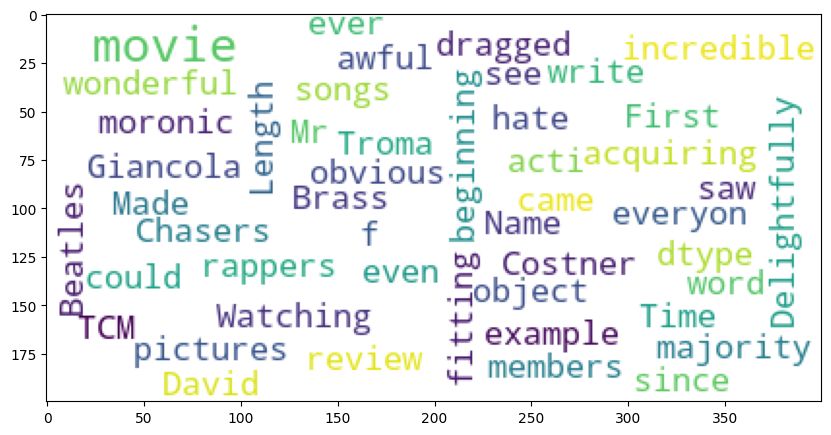

In [13]:
#Creating the word cloud to see what are the most common words in the dataset
from wordcloud import WordCloud
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
cloud_data = str(df["review"])
wordcloud = WordCloud(
                          background_color='white',
                          stopwords=set(stopwords.words("english")),
                          max_words=300,
                          max_font_size=25,
                          random_state=42
                         ).generate(cloud_data)
plt.figure(figsize=(10,15))
plt.imshow(wordcloud)

**We see the number of reviews on each class to understand the nature of the words in the dataset**

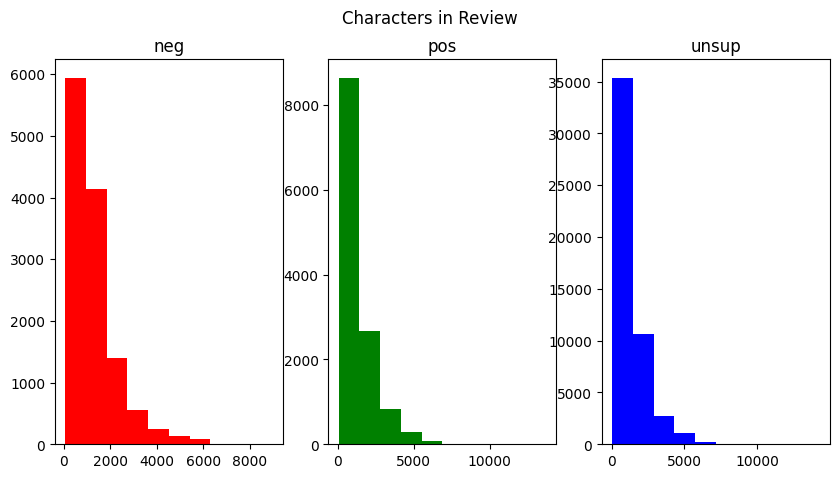

In [14]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(10,5))
df_train_len=df_train[df_train['label']=='neg']['review'].str.len()
ax1.hist(df_train_len,color='red')
ax1.set_title('neg')
df_train_len=df_train[df_train['label']=='pos']['review'].str.len()
ax2.hist(df_train_len,color='green')
ax2.set_title('pos')
df_train_len=df_train[df_train['label']=='unsup']['review'].str.len()
ax3.hist(df_train_len,color='blue')
ax3.set_title('unsup')
fig.suptitle('Characters in Review')
plt.show()

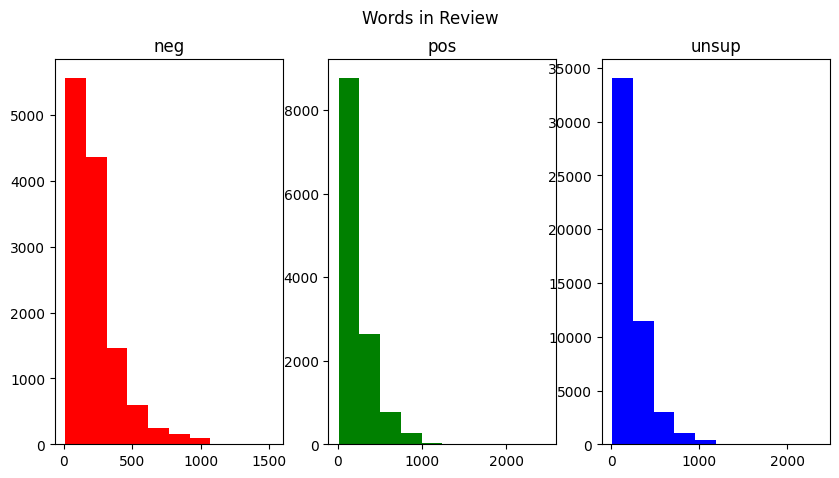

In [15]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(10,5))
df_train_len=df_train[df_train['label']=='neg']['review'].str.split().map(lambda x: len(x))
ax1.hist(df_train_len,color='red')
ax1.set_title('neg')
df_train_len=df_train[df_train['label']=='pos']['review'].str.split().map(lambda x: len(x))
ax2.hist(df_train_len,color='green')
ax2.set_title('pos')
df_train_len=df_train[df_train['label']=='unsup']['review'].str.split().map(lambda x: len(x))
ax3.hist(df_train_len,color='blue')
ax3.set_title('unsup')
fig.suptitle('Words in Review')
plt.show()


**Creating our corpus by taking the colum of reviews and adding it to our corpus to perform the NLP-specific EDA on**

In [16]:
corpus=[]
for x in df_train['review'].str.split():
    for i in x:
        corpus.append(i)


In [18]:
from collections import defaultdict
from nltk.corpus import stopwords
stop_words = set(stopwords.words("english"))

dic=defaultdict(int)
for word in corpus:
    if word in stop_words:
        dic[word]+=1

top=sorted(dic.items(), key=lambda x:x[1],reverse=True)[:10]


**Reviewing the number of stopwords in the dataset**

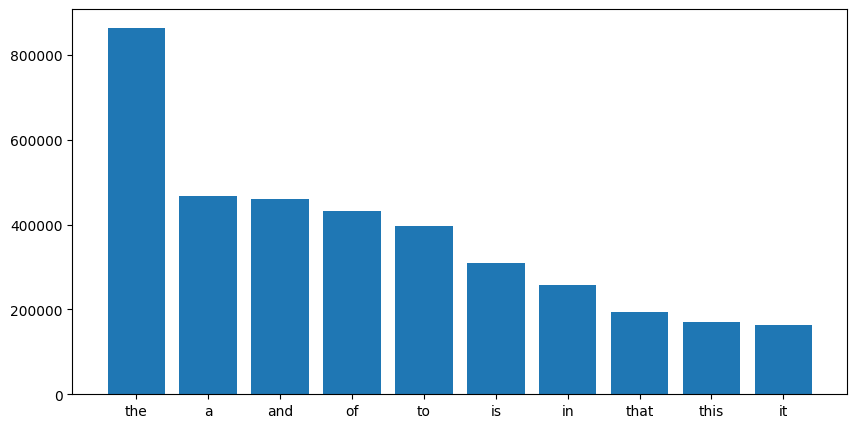

In [19]:
plt.figure(figsize=(10,5))
x,y=zip(*top)
plt.bar(x,y)
plt.show()

**Viewing the number of punctuation in the dataset**

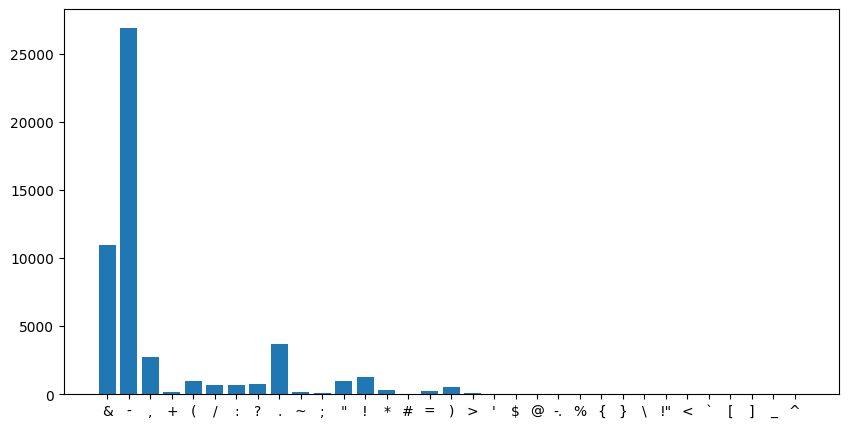

In [21]:
import string
plt.figure(figsize=(10,5))
dic=defaultdict(int)
special = string.punctuation
for i in (corpus):
    if i in special:
        dic[i]+=1

x,y=zip(*dic.items())
plt.bar(x,y)
plt.show()


**Viewing the most common words in the dataset**

<Axes: >

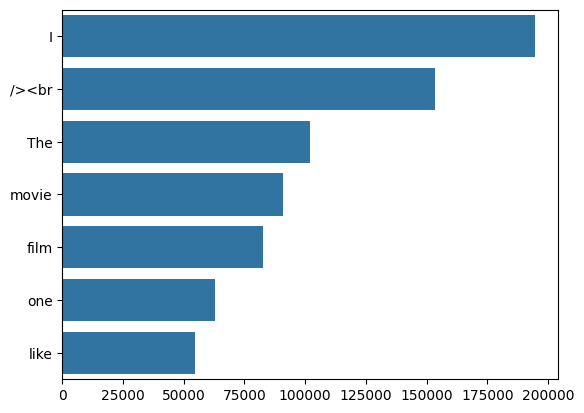

In [24]:
import seaborn as sns
from collections import  Counter
counter=Counter(corpus)
most=counter.most_common()
x=[]
y=[]
for word,count in most[:40]:
    if (word not in stop_words) :
        x.append(word)
        y.append(count)

sns.barplot(x=y,y=x)


## Data Cleaning

**Here we start to clean our dataset from all the unnecessary data using some helper functions based on Regex**

<ul>
    <li><strong>URL_remove:</strong> this function removes any URLs from the dataset</li>
    <li><strong>html_remove:</strong> this function removes any HTML tags from the dataset</li>
    <li><strong>emoji_remove:</strong> as this is a movie review, it can be written from mobile phones and containing emojis; this function removes any emojis in the dataset</li>
    <li><strong>punct_remove:</strong> this function removes all the punctiuation as it is useless and makes the dataset so big and adding a lot of computational power</li>
    <li><strong>text_cleaning:</strong> this is a general function that contains some regex expressions to perform further cleaning on the data</li>
    <li><strong>str.lower:</strong> this function call from str library makes all the characters is lowercase</li>
</ul>

In [26]:
def URL_remove(text):
    url = re.compile(r'https?://\S+|www\.\S+')
    return url.sub(r'',text)

def html_remove(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)

def emoji_remove(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

def punct_remove(text):
    table=str.maketrans('','',string.punctuation)
    return text.translate(table)

def text_cleaning(text):
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('[‘’“”…]', '', text)
    text = re.sub('\n', '', text)
    return text


In [28]:
import re
#Appling the helper functions on the dataset
df['review']=df['review'].apply(lambda x : URL_remove(x))
df['review']=df['review'].apply(lambda x : html_remove(x))
df['review']=df['review'].apply(lambda x: emoji_remove(x))
df['review']=df['review'].apply(lambda x : punct_remove(x))
df['review']=df['review'].apply(lambda x: text_cleaning(x))
df['review']=df['review'].str.lower()
df=df.drop(['Unnamed: 0', 'file'], axis=1)


**Splitting the data into training and testing after cleaning**

In [29]:
df_train_clean = df[df['type']=='train'].reset_index(drop=True)
df_test_clean = df[df['type']=='test'].reset_index(drop=True)
df_train_clean.head()


,type,review,label
0,train,story of a man who has unnatural feelings for ...,neg
1,train,airport starts as a brand new luxury plane i...,neg
2,train,this film lacked something i couldnt put my fi...,neg
3,train,sorry everyone i know this is supposed to be a...,neg
4,train,when i was little my parents took me along to ...,neg


In [30]:
len(df_train_clean["review"])
df_train_clean["review"][0].split('.')


['story of a man who has unnatural feelings for a pig starts out with a opening scene that is a terrific example of absurd comedy a formal orchestra audience is turned into an insane violent mob by the crazy chantings of its singers unfortunately it stays absurd the whole time with no general narrative eventually making it just too off putting even those from the era should be turned off the cryptic dialogue would make shakespeare seem easy to a third grader on a technical level its better than you might think with some good cinematography by future great vilmos zsigmond future stars sally kirkland and frederic forrest can be seen briefly']

In [31]:
splitted_reviews=[]
splitted_reviews_sentences=[]
for i in range(len(df_train_clean["review"])-74000):
    splitted_reviews+=df_train_clean["review"][i].split(' ')
#     splitted_reviews_sentences.append(df_train_clean["review"][i].split('.'))
    splitted_reviews_sentences+=df_train_clean["review"][i].split('.')


print(splitted_reviews_sentences[0])
len(splitted_reviews_sentences)


story of a man who has unnatural feelings for a pig starts out with a opening scene that is a terrific example of absurd comedy a formal orchestra audience is turned into an insane violent mob by the crazy chantings of its singers unfortunately it stays absurd the whole time with no general narrative eventually making it just too off putting even those from the era should be turned off the cryptic dialogue would make shakespeare seem easy to a third grader on a technical level its better than you might think with some good cinematography by future great vilmos zsigmond future stars sally kirkland and frederic forrest can be seen briefly


1000

In [32]:
splitted_reviews

['story',
 'of',
 'a',
 'man',
 'who',
 'has',
 'unnatural',
 'feelings',
 'for',
 'a',
 'pig',
 'starts',
 'out',
 'with',
 'a',
 'opening',
 'scene',
 'that',
 'is',
 'a',
 'terrific',
 'example',
 'of',
 'absurd',
 'comedy',
 'a',
 'formal',
 'orchestra',
 'audience',
 'is',
 'turned',
 'into',
 'an',
 'insane',
 'violent',
 'mob',
 'by',
 'the',
 'crazy',
 'chantings',
 'of',
 'its',
 'singers',
 'unfortunately',
 'it',
 'stays',
 'absurd',
 'the',
 'whole',
 'time',
 'with',
 'no',
 'general',
 'narrative',
 'eventually',
 'making',
 'it',
 'just',
 'too',
 'off',
 'putting',
 'even',
 'those',
 'from',
 'the',
 'era',
 'should',
 'be',
 'turned',
 'off',
 'the',
 'cryptic',
 'dialogue',
 'would',
 'make',
 'shakespeare',
 'seem',
 'easy',
 'to',
 'a',
 'third',
 'grader',
 'on',
 'a',
 'technical',
 'level',
 'its',
 'better',
 'than',
 'you',
 'might',
 'think',
 'with',
 'some',
 'good',
 'cinematography',
 'by',
 'future',
 'great',
 'vilmos',
 'zsigmond',
 'future',
 'stars',

In [33]:
splitted_reviews_sentences

['story of a man who has unnatural feelings for a pig starts out with a opening scene that is a terrific example of absurd comedy a formal orchestra audience is turned into an insane violent mob by the crazy chantings of its singers unfortunately it stays absurd the whole time with no general narrative eventually making it just too off putting even those from the era should be turned off the cryptic dialogue would make shakespeare seem easy to a third grader on a technical level its better than you might think with some good cinematography by future great vilmos zsigmond future stars sally kirkland and frederic forrest can be seen briefly',
 'airport  starts as a brand new luxury  plane is loaded up with valuable paintings  such belonging to rich businessman philip stevens james stewart who is flying them  a bunch of vips to his estate in preparation of it being opened to the public as a museum also on board is stevens daughter julie kathleen quinlan  her son the luxury jetliner takes 

**As our mission is to perform spelling correction on misspelled words; we must have misspelled words which called noised words. In the block below we create the noised dataset by taking it review by review and noising it, then saving the noised dataset into a file for future use**

In [37]:
!pip install nlpaug nltk spacy --quiet
!python -m nltk.downloader punkt stopwords
!python -m spacy download en_core_web_lg

  You can safely remove it manually.
  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mediapipe 0.10.21 requires numpy<2, but you have numpy 2.2.5 which is incompatible.
tensorflow 2.19.0 requires numpy<2.2.0,>=1.26.0, but you have numpy 2.2.5 which is incompatible.
c:\Users\genty\AppData\Local\Programs\Python\Python310\lib\runpy.py:126: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
  warn(RuntimeWarning(msg))
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\genty\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\genty\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already

     ---------------------------------------- 0.0/400.7 MB ? eta -:--:--
     ---------------------------------------- 0.5/400.7 MB 2.8 MB/s eta 0:02:22
     ---------------------------------------- 1.0/400.7 MB 3.1 MB/s eta 0:02:08
     ---------------------------------------- 1.3/400.7 MB 2.7 MB/s eta 0:02:29
     ---------------------------------------- 1.3/400.7 MB 2.7 MB/s eta 0:02:29
     ---------------------------------------- 1.6/400.7 MB 1.3 MB/s eta 0:05:00
     ---------------------------------------- 1.8/400.7 MB 1.4 MB/s eta 0:04:54
     ---------------------------------------- 2.1/400.7 MB 1.4 MB/s eta 0:04:42
     ---------------------------------------- 2.6/400.7 MB 1.5 MB/s eta 0:04:29
     ---------------------------------------- 2.9/400.7 MB 1.5 MB/s eta 0:04:26
     ---------------------------------------- 3.7/400.7 MB 1.7 MB/s eta 0:03:59
     ---------------------------------------- 4.2/400.7 MB 1.8 MB/s eta 0:03:46
     ---------------------------------------- 4

In [38]:
import nlpaug.augmenter.word as naw
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import SnowballStemmer
from collections import Counter
import spacy

In [39]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\genty\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\genty\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\genty\AppData\Roaming\nltk_data...
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\genty\AppData\Roaming\nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\genty\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping taggers\averaged_perceptron_tagger.zip.


True

In [40]:
import nlpaug.augmenter.char as nac
char_aug = nac.RandomCharAug(action="swap")
noise_texts = [char_aug.augment(sentence) for sentence in splitted_reviews_sentences]


# Save noised sentences to file
with open('noised_data.txt', 'w') as filehandle:
    for review in noise_texts:
        filehandle.write(f"{review},\n")

In [41]:
# from neuspell.noising import WordReplacementNoiser

# word_repl_noiser = WordReplacementNoiser(language="english")
# word_repl_noiser.load_resources()
# noise_texts = word_repl_noiser.noise(splitted_reviews_sentences)

# with open('noised_data.txt', 'w') as filehandle:
#     filehandle.writelines("%s ,\n" % review for review in noise_texts)


**Example of noised review**

In [42]:
noise_texts [0]

['story of a man who has unnatural feelnisg for a pig starts out with a opening scene that is a terrific example of absurd comdye a formal ocrhestra audience is turned into an insane violent mob by the rczay chantings of its singers unfortunately it stays bsaurd the whole time with no general narrative eventually making it just too off putting even those from the era should be turned off the cryptic dialogue would make shakespeare seem easy to a third grader on a technical leelv its better than you mitgh think with some good cinematography by future great vilsmo zisgnmod future stars sally kirkland and frederic forrest can be seen briefly']

In [43]:
def _create_frequency_matrix(sentences):
    frequency_matrix = {}
    stopWords = set(stopwords.words("english"))
    #ps = PorterStemmer()
    ps=SnowballStemmer(language="english")

    for sent in sentences:
        freq_table = {}
        words = word_tokenize(sent)
        for word in words:
            word = word.lower()
            word = ps.stem(word)
            if word in stopWords:
                continue

            if word in freq_table:
                freq_table[word] += 1
            else:
                freq_table[word] = 1

        frequency_matrix[sent[:15]] = freq_table

    return frequency_matrix



def get_count(words):
    word_count_dict = {}
    word_count_dict = Counter(words)
    return word_count_dict

#word_count_dict = get_count(book_words) # dictionary with the count

# calculate probability of the occurrence
def occurr_prob(word_count_dict):
    probs = {}
    m = sum(word_count_dict.values())
    for key in word_count_dict:
        probs[key] = word_count_dict[key]/m #calculate prob for each word
    return probs


In [44]:
#from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
filtered_sentence = [w for w in splitted_reviews if not w in stop_words]



print(len(filtered_sentence))
print(filtered_sentence)
# print(noised_sentence_filtered)


114307
['story', 'man', 'unnatural', 'feelings', 'pig', 'starts', 'opening', 'scene', 'terrific', 'example', 'absurd', 'comedy', 'formal', 'orchestra', 'audience', 'turned', 'insane', 'violent', 'mob', 'crazy', 'chantings', 'singers', 'unfortunately', 'stays', 'absurd', 'whole', 'time', 'general', 'narrative', 'eventually', 'making', 'putting', 'even', 'era', 'turned', 'cryptic', 'dialogue', 'would', 'make', 'shakespeare', 'seem', 'easy', 'third', 'grader', 'technical', 'level', 'better', 'might', 'think', 'good', 'cinematography', 'future', 'great', 'vilmos', 'zsigmond', 'future', 'stars', 'sally', 'kirkland', 'frederic', 'forrest', 'seen', 'briefly', 'airport', '', 'starts', 'brand', 'new', 'luxury', '', 'plane', 'loaded', 'valuable', 'paintings', '', 'belonging', 'rich', 'businessman', 'philip', 'stevens', 'james', 'stewart', 'flying', '', 'bunch', 'vips', 'estate', 'preparation', 'opened', 'public', 'museum', 'also', 'board', 'stevens', 'daughter', 'julie', 'kathleen', 'quinlan', '

In [45]:
lmtzr = SnowballStemmer(language="english")
lemmatized_words = [lmtzr.stem(word) for word in filtered_sentence]
lemmatized_words


['stori',
 'man',
 'unnatur',
 'feel',
 'pig',
 'start',
 'open',
 'scene',
 'terrif',
 'exampl',
 'absurd',
 'comedi',
 'formal',
 'orchestra',
 'audienc',
 'turn',
 'insan',
 'violent',
 'mob',
 'crazi',
 'chant',
 'singer',
 'unfortun',
 'stay',
 'absurd',
 'whole',
 'time',
 'general',
 'narrat',
 'eventu',
 'make',
 'put',
 'even',
 'era',
 'turn',
 'cryptic',
 'dialogu',
 'would',
 'make',
 'shakespear',
 'seem',
 'easi',
 'third',
 'grader',
 'technic',
 'level',
 'better',
 'might',
 'think',
 'good',
 'cinematographi',
 'futur',
 'great',
 'vilmo',
 'zsigmond',
 'futur',
 'star',
 'salli',
 'kirkland',
 'freder',
 'forrest',
 'seen',
 'briefli',
 'airport',
 '',
 'start',
 'brand',
 'new',
 'luxuri',
 '',
 'plane',
 'load',
 'valuabl',
 'paint',
 '',
 'belong',
 'rich',
 'businessman',
 'philip',
 'steven',
 'jame',
 'stewart',
 'fli',
 '',
 'bunch',
 'vip',
 'estat',
 'prepar',
 'open',
 'public',
 'museum',
 'also',
 'board',
 'steven',
 'daughter',
 'juli',
 'kathleen',
 'q

# show dependences

In [46]:
import spacy
from spacy import displacy
nlp = spacy.load('en_core_web_lg')

In [47]:
for i in splitted_reviews_sentences:

    doc = nlp(i)

    for sent in doc.sents:
        docx = nlp(sent.text)
        if docx.ents:
            displacy.render(docx, style='ent', jupyter=True)
        else:

            print(docx.text)


sorry everyone i know this is supposed to be an art film


f


the incredibly selfinvolved family keep reminding us of how brilliant and talented they are to the point of strangulation i read a poem of yours the other day it was in  i dont know  the new yorker


and i mean everything in between is basically the directors desperate effort to fill in the minutes i like disturbing movies i like dark movies
and i dont get troubled by gritty scenes  


plot is not worth discussion even if it hints at corruption murder power and the rest of thriller related topics characters are interesting though sometimes not realistic but interesting neverthelessdevelopment is slow like tea drinking ceremony visuals not stunning but good enough to ease the eye strain good movie to watch after dinner before going to bed  nothing shocking too much nothing overexciting movie sitcom stylei liked woody  excellent performance had to fight the plot inadequacy and did the job pretty good the rest are bearable though very predictable the whole is watchable and better than most tv shows


but i like to watch a movie with meaning


but he said things that we dont expect out of a bird the movies pure hokum but harmless


so i thought didnt these people make


ok


but it wasnt for tashanafter watching it
i knew why it was entertaining


i think vaibhavi merchant just sleep walked through this film vishalshekhar have put up a good score


but he is in his stereotyped self you wont mind missing this film


i had no idea what the film is about before i saw it because tashan only had teaser trailers while it was being promoted so i asked my friends if they knew anything about it


i dont want to go too far into detail because i cant really justify wasting much time on reviewing this film
but i had to give an alternate opinion to hopefully help people avoid the movie the animation is crud and the story alternates between boringpointless to extremely irritating the humor was completely lost on the audience and yes  ghost in the shell fans this is not an action scifi or anything like that  its an attempt at slapstick comedy and the humor just did not work after being translated
it was a total chore to watch this movie and horrible way for me to kick off the film fest especially considering how excited i was and how open i was for anything  i wasnt expecting a ghost in the shell sequel but i was expecting something entertaining and it simply didnt achieve this yaaawwnnn rent kinos journey instead


but i myself dont think so instead she became slim


but she did not looked good leaner


please if you want to torture yourself go ahead watch this


actors i pity them


but id really give this movie a  an unachieved film


and i like black humorgood with that point set


were you editors doing tashan maybe


i guess
i would have liked to write about the story but there wasnt any i would have liked to quote a couple of hard hitting dialogs from the movie but hinglish is only funny for like  minutes after that its overkill i would have liked to swoon over the keepuguessing suspense


i could be wrong youve been warned anyways


blah blah blahit seems cool and mysterious but the episode stars to get worse and worse as it lurches forward until its sad and unsatisfying end the worst episode well except for chocolate


i thought the screwfly solution was pretty bad


so whats the deal with everyone thinking they have a divine to murder any woman they see then theres the fact people get turned on by different things what about gays for instance will they kill guys instead of women


but noone really stood outthe screwfly solution is easily the worst masters of horror episode ive seen but bear in mind i havent seen all of them yet as a stand alone piece of entertainment it did nothing for me  as a show made by a socalled master of horror it disappoints me even more
i love the frequently misnomered masters of horror series horror fans live in a constant lack of nourishment projects like this and the similar greenlight project with gave us feast  like it or lump it are breeding grounds for wonderful thought bubbles in the minds of directors with a horror bent to develop and bring to maturation food for we who love to dine on horrorthis one began with a kernel of reallykoolidea and ran  right off the edge of where in the world am i going with thisi dont know how to spoil the spoiled but spoiler ahead all of a sudden  
no there was that light drifting across the night sky earlier  we have long haired luminescent aliens
huh  huh
brain drilling males and  
yeah
i get it


i was fascinated as to how truly bad this movie was was the viewer supposed to learn something or reflect on anything here what was up with the pumpkins was i supposed to be impressed with the motel shots does it matter that there are some garbage bags on a rooftop across the street of a hotel why does the narrator unsuccessfully mock the people he interviews it is so obvious that he edited out the really informative parts of his interviews to achieve mockery the best part of the movie was the interview with the film professor who tells us how bad this movie will be even before it is finishedi am truly amazed i believe that the creator is struggling to become an intellectual or is trying to impress the intellectual community


the author sets out on a journey of discovery of his roots in the southern tobacco industry because he believes that the completely and deservedly forgotten movie bright leaf is about an ancestor of his its not
and he in fact discovers nothing of even mild interest in this absolutely silly and selfindulgent glorified home movie suitable for screening at the directors drunken family reunions but certainly not for commercial  or even noncommercial release a good reminder of why most independent films are not picked up by major studios  because they are boring irrelevant and of no interest to anyone but the director and hisher immediate circles avoid at all costs


much worse than the original it was actually painful to sit through


oh and then theres the poliwhirl who thinks hes a poliwrath
you
d think that guys that work with these characters constantly would at least learn what they are basically not much could save this little ill fated dub which is very unfortunate considering its potential


this is an awful film yea


well okay it might be interesting but its not because its so badly paced and and only partly acted i can only imagine what the close ups of the dancing tushes looked like on a big screen probably more laughable then they do on tv


oh and lots of gun fire


but unfortunately it is not enough knowing kunefe and  names of other foods doesnt make a person understand a culture for example


well at least my theater group did lol
so of course i remember watching grease since i was a little girl while it was never my favorite musical or story it does still hold a little special place in my heart since its still a lot of fun to watch i heard horrible things about grease  and thats why i decided to never watch it
but my boyfriend said that it really wasnt all that bad and my friend agreed so i decided to give it a shot


but she must stick to the code where only pink ladies must stick with the tbirds so the new student decides to train as a tbird to win her heart so he dresses up as a rebel motor cycle bandit who can ride well and defeat the evil bikers from easily kicking the tbirds butts


but i warned you this is just a pathetic attempt at more money from the famous
boygirl love affairsequel with songs only this time shes the punkette and hes the straight arrow moviebuffs out there actually like this movie it has fans i must say the mind reels grease  is a truly lame enterprise that doesnt even have the courage moxy or sheer gall to take the memory of its predecessor down in flames like jaws  or


when i was  grease  was like crack it was a classless shameful euphoric and powerfully addictive experience my sister


i had to do a search on the actresses to find the board of this film because the title is now an unexpected love its not really worth looking for
but i was unfamiliar with both leads and wondered why they were headlining a lesbian flick on lifetime everythings pretty restrained
and you dont really get an idea of who these characters are so as a viewer i wasnt able to become emotionally invested in the storyline i guess im not the target audience for this
but im not sure who is everythings muted and soft focus and earth tonesnothings very interesting


but then she either wasnt allowed by studio execs to give the story some truetolife gusto or didnt have the cojones this movie could go in the enyclopedia as the standardissue bad lifetime tv movie


sheesh no cliche is left unturned


this movie was okay


or they totally shunned her this is not typical of interactions between gay and nongay relatives and friends it is usually a mixture of emotions and values that come into play it is possible to love people and treat them with respect while not necessarily condoning the choices they make sadly the movie showed none of these types of interactions for a movie trying to portray tolerance and acceptance it struck me as very intolerant movie then at the end kate apparently decides after all these years she wants to be with mac and everything is hunky dory  is that what being gay is really all about come on
why do all movies on lifetime have such anemic titles an unexpected love  


i am an actorproducer director and what i am about to say are facts this project was the worst film in movie making history from producer to director and the edit of this so called film is a joke and i mean a big joke why would blockbuster released such crap i take my work very serious
and this film is an insult to my profession was the director trying to make a bad movie i dont think so i seen bad zombie movies but this takes the cake the coffie and everything on the damn table this movie sucks i really hate to talk bad about other filmmakers because i am one myself
but please consider in taking up a different profession i respect the fact that you completed a movie
but i have to ask you  were you smoking crack  


er i mean as they did before becoming zombified this gives our auteur ample opportunities to shower us with more of his golden dialog yes a golden shower
it


seriously crappy moviefirst off the movie starts with a cop and his partner parked outside of a warehousefurniture store the bad cop takes a girl which they had pulled over into the warehouses attic while the newbie cop sits outside and ponders what could be happening up there the bad cop eventually returns with a heavy duffel bag and the newbie cop doesnt think there are any problems but he still wonders what was in the bag so he asks gets a bullshit response
and then he thinks everything is ok for nowthe bad cop repeats this process and even once with a tit scene made it slightly better but eventually people start to catch on which took awhile considering how fing obvious it was one girl gets a voodoo curse placed on her just in case she dies like ya do now the bad cop eventually kills this magically protected bitch


i cant believe blockbuster carries this movie it was so bad i was totally fooled by the box art dont be fooled its not worth your time i promise you i dont know if the positive reviews for this flick were a joke or what i am so disappointed  the description on the back of the box doesnt even match the girl that has the voodoo done on her is a stripper the synopsis on the back says she is only  did the people writing the description for the film even bother to watch it those positive reviews had to be a joke they just had to be if anyone actually liked this flick then ive lost all faith in humanityand dont even get me started on the story compared to the title or the fact that the entire movie was done all in  locations or that the cops didnt even have close to real uniforms why would i even say that who cares about the cops uniforms compared to the rest of the movie the uniforms were spot on this movie is an insult to the zombie genre and all of its fans


hahahhaa i dont want anyone else to waste a good movie night on this pos movie i dont even know how it got the ratings that it did t should be in the negative


i guess its pretty much some kind of attempt at a horrible porn  snuff movie with no porn or no real horrible bits apart from the acting plot story sets dialogue and sound i wrongly assumed it was about zombies watching it is actually quite scary in fairness youre terrified someone will come over and youll never be able to describe what it is and theyll go away thinking youre a freak that watches homemade amateur torture videos or something along those lines im so taken aback im writing this review on my mobile
so i dont forget to attempt to bring the rating down further than the current  to save others from the same horrible fate that i just suffered i worst film ive ever seen and i can say with hand on heart it will never never be topped


even that goodthe only suggestion i can make is that maybe the writer tried to do too many things and ended up with an incoherent messit ended up being a free rental
and i still feel ripped off
i rated it a  out of  because imdb wont allow me to use decimals
not worth the video rental or the time or the occasional effortsmakeup that a child can do acting was over donepoor directing editing was very choppymany things made no sense or just seemed gratuitous sound was badly dubbed music was highly inappropriate casting was extremely offmust have been on crack zombies that talk let alonedrive dance workjust pisses me off and the bad guyholy crap as horribly casted as he washe was the best looking zombie of all which doesnt say muchthe cover art was good but very deceivingas was the main menu of the dvdgreat artwork and musicdont bother
thank god i didnt waste my money renting it


 
review may contain some spoilers  ill make this review short and sweet


usually i support independent art and i try to be very comprehensive and toleranti tend to support everybody because their efforts are worthbut this movie just moves away from all comprehension and tolerance limitsimagine the following  think about the really worst horror movie you have ever seen in your life so  think about some great attractive art for that movies dvd boxand a promising  voilã  you got zombie nationsee it only if you really dont have anything else better to do anything is better
notice i have given this  star if the option been given i would have given this zero as i put this dvd into my tv and sat down on my couch i was expecting some of the worst film making at its finest i looked this movie up on imdb and saw that it was the worst rated movie
so i guess i came into it critical of every mistake
but it didnt prepare me for the crap that was about to spew from my television screenthe box makes this movie out to look âwell


im not saying i can make a better movie than this
but i am thinking it


so could you and so could someone who had never seen a movie before its pitiful and without doubt the worst movie of all timehonestly the very worst movie of all time youll note by the way that the only positive reviews give this a  and urge you to buy the dvd i cant imagine anyone neutral genuinely thinking this is a good film its  and thats generous


zombie nation  rhey i was bored i looked in my comcastic little box to find a movie to watch zombie nation


but you wouldnt know it buy the sharp clean clothes theyre all wearing the women then act very poorly and take their revenge


yeah


a few billion times man


oh well what can i expect from a movie where they throw in a random fight scene for no good reason in a warehouse where they apparently ship boxes of air around the world so for all of those who worship mystery science theater  or if you just like reaming on bad c movies c for craptastic then this is the movie for you    or not


er i mean as they did before becoming zombified this gives our auteur ample opportunities to shower us with more of his golden dialog yes a golden shower
it


btk killer green river killer zodiac killer the man keeps putting out absolute garbage and the ironic thing is he loves his crapive never seen a ulli lommel film


and i unbearably couldnt take it anymore as it wouldnt end


nothing special he has some really cool lines thoughabout the story although it was a bit obvious and exaggerated at times it was good


and i feel ripped off


however if you are entertained by the prospect of watching probably the most indefensibly abysmal film ever â this is for you now whenever anyone asks me what the worst film i have ever seen is i will say zombie nationseriously


this is one of the worst films ever i like cheesy movies but this is simply awful where are the images in the film that are on the box i think more money was spent on the dvd box illustrations than on the entire film why would a company release a dvd that the cover is so misleading i feel like such an idiot for renting this movie based strictly on the box as much as i explore imdb i should have done a little research and made a list prior to visiting my local video rental store i have no one to blame except myself i want my money and time back do not watch this movie even if curiosity is motivating you stick cocktail umbrellas in your eyes instead it will be much more enjoyable you have been warned


and i found this gem i looked at the cover


it
i really have nothing nice to say about this movie dont do it


oh yes dont forget jealousy can bring about tainted hearts and murder


this hitchcock movie bears little similarity to his later suspense films and seems much more like a very old fashioned morality tale a young couple receives an inheritance that they believe will make them happy they spend the money traveling about the world and living a very hedonistic existence however after a while the excitement begins to wane and the couple become dissipated and pointless in their existence however out of no where when they are on a luxury cruise the ship sinks and they lose everythingand end up much happier in the end because they now appreciate life what an odd silly and preachy film personally id like to inherit all that money and find out if it makes me miserablethe production values are relatively poor compared to later productionsa rough film with poor sound quality and rather amateurish acting


yeah
right and on top of that it was awfully depressing to see those stupid middle class uptheirownbackside kids mess about with bits of old plastic having fun do me a favour
and why dont you go and slit your wrists or do a coke overdose on mama and papas money you make me sick


oh yeah


nobody could like this movie for its merit but if you have a sense of humor and enjoy schlock movies for their  quality then this is for you it ranks up there with road house for its preposterous characters sets and story line the bad writing really cracked me up


being a fan of cheesy horror movies i saw this in my video shop and thought i would give it a try now that ive seen it i wish it upon no living soul on the planet i get my movie rentals for free
and i feel that i didnt get my moneys worth ive seen some bad cheesy horror movies in my time hell
im a fan of them but this was just an insult
slashers  outta  starsnot really a very good movie


so
anyway i would recommend you watch it and make up your own mind


nevermind


but thats just me


but well it really sucked


then lanza


but i was distracted by all the crappy landmarks they made a point to show this movie may have been good if there was actual acting in it


but somehow it never quite came together


then on


yeah right its


so even though ive only rated superdome a  ill give this episode a generous  on my  rating scale


i admit i was eager to see the movie


but i do remember it as a very dull movie i kept debating whether to walk out of it the store was not at all interesting or engaging was a  rate america graffiti imitation none of the performances make it worth watching either one of the biggest disappointments since a local newspaper reviewer gave it a high rating


i remember when independent films meant original and daring not safe and predictable


i guess the rest of the movie is merely treading water to kill time i guess a brochure only


all is said and done the ultimate error with this movie is that it is a mundane and tiresome piece of pseudoaction poppycock that fails to keep anyone awake it also fails to make anyone give a good crap about any of the characters all in all ts just plain boring that being said rent this when you are suffering from insomnia


that nyugen was in this movie as otherwise i wouldnt have wasted  buying it off ebaytake it from me  avoid like   offsuit dire
totally ridiculous if you know anything about poker you will find it absolutely appalling but also entertaining because it is so clueless the nerd who made this movie is obviously very religious and knows slightly about the game of poker


people please dont bother to watch this movie this movie is bad its totally waste of time i dont see any point here its a stupid film with lousy plot and the acting is poor i rather get myself beaten than watch this movie ever again


an updated version of a theme which has been done before while that in and of itself is not bad this movie doesnt reach the ring like the other inherent and pure evil ones do predictable ambitious attempt that falls short of the mark not worth sitting through for the tired contrived ending


well the writing was very sloppy the directing was sloppier and the editing made it worse at least i hope it was the editing the acting wasnt bad


i believe the super smart one
and it also had some very cheap ways to cover plot holes it was like trying to cover a volcano with cheap masking tape it was not pretty anyway if you see it wait for the  theater or video unless you like pretty much every movie you see then i guess youll like this one


that fast yea
you know those types of stupid movies yea


yeah thats the ticket why is it that every twentysomething filmmaker believes that his life so far is so important so interesting that the world cant wait to see it onscreen if this movie is as autobiographical as it seems then the auteur better be looking over his shoulder for policemen bearing fugitive warrants
a lot of people seemed to have liked the film


but they didnt build up to it


but i was able to see through it most of the time so without giving anything away i must say that unless you like the actors in the film there is no real reason to watch this movie i could be mistaken
but i just didnt understand why there was so little or too much of the film i cant decide which one that would be
so i say judge for yourselves i dont even know if renting it would be a good idea the cost and all plot  characters  acting  overall  i feel like thats too high really i am staying with my vote up at the top


but otherwise you can chalk this up as one of universals instantly forgettable misfires


ok


did the original movie end when the screen went white and were you forced by the vapid movie powersthatbe to tack on an ending unfaithful to the core of the movie or did you tack that maudlin ending on yourself ive read youre brilliant


but please moviegoers am i the only one who feels this way about stranger than fiction


this just isnt that movie


duh then


kinda dull give this one a big miss
to be honest i had heard this was pretty bad before i decided to watch it


happened upon a copy of this not mine


i was still tempted to ask for my money backit really was that bad


okay then youll probably love this movie personally it doesnt matter to me what kind of movie it is as long as it is realistic make me believe that the story is true this story was so obviously fictional in so many aspects that i came away feeling unsatisfied


i mention  standouts the leading man in this film certainly has the look


but we never got to see any of it watch the movie to see why you wont believe
itthe grainy film look
ah
yes


well yea sure


because its so bad its just bad


blah


a good deal of running around a badly conceived adversary with very little complexity a scientist who works in communications sending off signals into space and receiving them gets caught up with aliens along with his pretty wife he invades their territory and is given secrets about them he becomes rather traitorous in the process granted he is given little choice
anyway there is a scene where he gives them everything they want this is a dull movie with lots of long stretches where little happens the plot isnt technically bad its just that we are usually following a car a trip through a woods investigating a building this is what editing is all about i suppose the story wouldnt technically support much more not much here


and he mentioned starship invasions
well im
sorry


but starship invasions was actually goofy fun starship invasions is terrible but terribly entertaining end of the world is much much much worst its beyond dull and inert with no entertainment value whatsoever


id give this one a miss it falls into that narrow range of wasted celluloid between star odyssey and ufo target earth


but it i found out later that it had every explosion or special effect in the entire movie about  and even some that werent in the movie there was some sort of plot relating to the aliens but the aliens were never actually shown in the movie as far as i remember it was clearly a case of someone making a buck off a cheap movie designed to scam people i guess my world of innocence ended that day when i found out there were bad people out there who make bad bad movies


i justthink the script had potential but the execution turned it into a clichã© and an awful one at that just no


now i flicked onto this just out of curiosity and had to keep watching  in the same way that you watch a car crashi appreciate the fact its a spoof but that should not stop me from criticising the godawful directing acting and dialogue seriously this rated as one of the poorest movies i have seen  it looked more like an episode of tales from the cryptkeeper and a poor one at thatokay  a few criticisms  when the doctor had his heart attack in front of the monster we never see the monster attack him
so we assume its a heart attack the army then launch shells rockets bullets at the monster  which was feet from the doctor  


did i mention the rubber suit monster  that godawful music nonstop


this piece aint really worth a comment its simply the worst horror movie i have ever seen the actors are bad as bad can be and the whole plot is so silly it nearly made me cry shame on you
i say


this movie is outrageous by outrageous


and


i mean how do you not realize that the movies is a cheap rip off of scary movie for example at least get some good actors in there
and then maybe it would have been pulled off as a good horror movie
when i read the back of the dvd case i thought that it sounded really interesting


but i can only take so much crying scenes looked like the actors were having hysterical fits of laughter there was no delivery for their lines amateur doesnt even come close to the acting in this filmanyone who came on here saying that this film was good had to have been on some really good drugs while they were watching the movie its the most pointless thing ive ever had the displeasure of watching do not watch or buy this movie
when it comes to horror movies i am more than willing to suspend disbelief ignore subpar production values and overlook plot holes in the interest of a good scare this movies simply has no good scares to offer it cant even be enjoyed as camp bad dialogue bad acting bad direction the kills were predictable and poorly staged the music was annoying the camera work was wretched even the costumes were bad i felt really bad for the actors who were obviously trying but who had to deal with terrible contrived dialogue and an obvious lack of direction


so you might be reading some of the comments posted on this film and you might be thinking to yourself


you have decent sound equipment


but i sat through this thing thinking that with a different director and a recasting jj with an actress that at least could elicit sympathy this could have been quite a cute little movie


i hate to sound like an old person


although i had no earthly idea on what to expect from this movie this sure as hell wasnt what i would have had in mind had anything actually come to mind once i heard of its existence
all i knew was that i had to own a movie called please dont eat the babies unfortunately i could only find a copy under its alternate title island fury looking back i guess i could call it a loselose situation on one hand i still dont get to be known as the guy who owns a movie called please dont eat the babies and on the other hand island fury would ultimately reveal itself to be an awful pointless boring unwatchable piece of garbage


i ithought maybe the director had too and when the flashback ended that would be the end which would have worked for me considering this disappointment would have been a halfhour shorter this pointless movie within a pointless movie does eventually end and real stuff does happen but
its stupid
i guess i didnt exactly expect a movie filled with infants being devoured or anything like that
but i did expect some form of outlandish bentertainment mostly just a confusing inept storyline unsure of its genre my advice would be to seek out something worthwhile like attack of the beast creatures if anyone i would only recommend this one to serious bmovie collectors who must have them all anyone else interested probably has brain damage what really gets me is that i still have no idea why they called it please dont eat the babies


and then when theyre away from it the boat blows up and when they get back to the house their friends have mysteriously disappeared well it seems as though these kindly folk raise their own vegetables


j


but i can stretch my suspension of disbelief to admire its reason for existence perhaps to justify my sitting through itthe script in and of itself features some surprisingly bad writing


i bought bloodsuckers on ebay a while ago i watched parts and deemed it just too dumb to review again the excessive amount of watery blood at the beginning is just plain obsolete  not to mention the whiparound wind sounds my friends
and i made a super low budget movie and the effects still exceeded this crap festas for the amount of mistakes in this movie there are way too many to count i knew one of the actors  believe it or not he was my theatre teacher ha final verdict dont bother with this horror flick  stars out of a possible


so she persuades him to listen to her drone on more as she brings him to her cabinwhat little romance sex or for that matter anything at all this film has besides bitter rantings is hardly enough to justify the price of a rental unless you are one of those who love dramas where nothing interesting happens at all yes the ending is very nicely done
but it is scant reward to subject yourself to what amounts to a turning your living room into a virtual therapy session with a narcissistic whinerof course some people like it i could be wrong


there are a lot of pretentious people out there who will pretend that this is endowed with some kind of beautiful meaning and that ignorant fools like me dont get it obviously this means that we should stick to hollywood drossit has every ahem artistic clichã© in the book  


but i suspect most of them could not state it in words im not sure i can myself
but perhaps it comes to this or something like it things come things go such is life
but we carry on or at any rate some of uspeople like morverndo no doubt a more erudite critic could construct a more adequate definition but the important fact is that there is a pointpossibly the sum of the entire story is the pointand that this would have been the main thing to keep in view and to carry over in adapting the story to film the maker of this film evidently missed the point and doesnt substitute one of her own
and so the film is about nothingthis is not the usual complaint of a booklover that his favorite text has been violated the merit of the book is something i conceded grudgingly in reading it
i found it a bloody nuisance and an occasion for kicking the author in the pants and getting him in to finish the job properly the narrative is supposed to be the work of the halfeducated morvern


i attribute this to the fact this is the start of the series and no one knew where to go with it yet this episode mainly focuses on the culprit of the crime instead of columbos investigation as many later episodes would do


im a fan of arty movies but regretfully i have to report this movie to be pretentious drivel agonisingly slow to develop a nonexistent plot based on a promising premise the experience is shall we say trying even after bad movies i feel that i learn something or enjoyed some aspect


but now he has no real purpose the ending is needlessly fluffy and the only thing different between this and other crappy new episodes  is that the kids can interact with adults whoa what funno stars at all for the rugrats all growed up klaskycsupo please destroy this show before it gets any worse


so i dont need it getting broken on idiotic crap like thiscareful with that remote is this supposed to be some fascist propaganda to make people believe in some invisible realm of uberman control and mastery or what why does it existthis is the most inane show completely unbelievable and contrived


anymore i wont bother with the correctness of mine either


but i couldnt find it on itunes talk about seeing into the futuretoo funny for words the rest of the movie is forgettable the score and songs are more interesting than the script ditto the sequel which begs the question of why they would do a sequel at all my understanding was that foreign sales drives a lot of these b movies doesnt say much for the worlds viewing habits


this film was hard to get a hold of and when i eventually saw it the disappointment was overwhelming


i know that stuff like this dont usually happen


but it is done to often and really gives muslin people a bad name


not any morejust cancel it and be done with it its not worth watching any moreit might still be saved but a lot of change would need to be madebring back the old format


so deathly lame
i cant believe it the performances are very hammy and over acted


oh silly you style acting that comes with a no laugh script they roll their eyes and shake their heads at each other as if to say arent we zany isnt this funny


but i was kind of disappointed still i appreciate cbc for putting up such concept in front of the viewers anyway i wish best of luck for the future
im trying to picture the pitch for dark angel im thinking matrix im thinking bladerunner


right yes we do get to see some running on walls and slow motion shootouts  secs approx
but these scenes are about as cool as the stupid hardbodys attempts at making jokes about male incompetence now
and thenand yes we are also served a number of leads that lead absolutely nowhere as if the script was thoughtout by the previously unseen cast while shooting the scenesbelieve me it is as bad as it possibly can get in fact it doesnt deserve to be taken seriously but perhaps i can make some of you not rent it and save your money


average and surprisingly tame fulci giallo which means its still quite bad by normal standards but redeemed by its solid buildup and some nice touches such as a neat time twist on the issues of visions and clairvoyancethe genres wellknown weaknesses are in full gear banal dialogue wooden acting illogical plot points and the finale goes on much too long while the denouement proves to be a rather lame or shall i say limp affairfulcis ironic handling of giallo norms is amusing though yellow clues wherever you  out of  limping killers
i was really disappointed in this movie those that voted this thing a  have a screw lose the acting was ok kinda wooden and cardboard the ending was sorry i just didnt care for this at allno way could i recommend this mess
man the ending of this film is so terribly unwatchable and dated that my entire film aesthetics class laughed like crazy now most of the rest of the film was okay


notorious
i think this is the worst ending ever what a let down


nah hed knock back a bottle of rye and twenty unfiltered camels on the couch or floor of his flyspecked office or in the stink of a lousy downtown la flop house wiping the dried red crust and oil smeared mud off his face thats how spillane wrote trash paperbacks for sure but how do you make it worse give some desperate scheming producer a blank check because he thinks any film noir titled crap will sell at the box office add some overthehill hot tomatoes and just generally screwup the storyline by some retard drugged out screen writer thats how


youll have to wait for someone else to adapt your fine work into something more fitting


normally i dont like to let myself get so ascerbic but the bell jar is one of my alltime favorite books and to watch what they did with it makes me literally crazy


it had horrible problems with the cliffs notes level of adaptation script acting and special effects not to mention lack of evidence of ever having read the book


that with the current popularity of adapting childrens literary fantasy series nobody thought of adapting a wrinkle in time and its sequels for the big screen giving it the scope it deserves


but id never been able to locate it well my students


but i also think larger things like the art direction was a off take for instance the way they made camazotz look with its strangely darkened skies the creepiness that comes across in the book is that camazotz could be earth it looks like earth it has people on it that look like humans the skies are blue the grass is green and there are children playing but something is a little bit off the directors chose to make camazotz a complete other instead of taking the lesson in the book and applying it to the overall direction of the movie the lesson of course is that camazotz could very well be earth that is if we forget how to love it wouldve been much creepier to have a beautiful afternoon as theyre walking down the street with the kids bouncing the balls in the same rhythmi unfortunately did not watch the end maybe someone can tell me how disney messed up the end as welloverall an artistic disappointment


and i absolutely loved it
im afraid i cant say the same for the film


yes i got to admit there was cool effects
but seriously they were all done terribly and not serial in any way possible if you read the book you will be crushed by the movie i wish could give it a  but sadly i can only give it  a half could have been useful


i got all excited when i saw the ads for this movie because i recently read the book and really enjoyed it the movie however did not meet my expectations having read the book recently prepared me for big let down as often happens when stories are translated into movies the characters didnt seem to fit very well with the book the direction was weak i had a hard time getting into the characters there wasnt a real connection with the viewer about what was going on the dialog didnt explain adequately what was happening it just seemed slapped together and rushed through all in all
i was very disappointed with the movie i suppose if you havent read the book it might be ok by itself at the very least it might entice you to read the book which youll probably enjoy more


i sure wish i could i
d it
i can only imagine it might be closer to the real story than this poor adaption this movie needs to be xd
i have grown up pouring over the intertwined stories of the wrinkle in time chronicles my dream was that one day a screenwriter would come across their child sitting in a large sofa reading a winkle in time and would think what an amazing movie this would make sadly enough that screenwriter failed changing characters throwing in lame humor and all out destroying the plot i know that it is a hard task to change a well loved novel into a movie but why cant you stay true to the book why must you change the way characters think and act for those of you who have not read the book pick it up find a soft couch and let your imagination run wild


i love to laugh nothing is quite so squirm inducing as characters on the screen laughing hilariously at things that are totally unfunny


and i lasted to the very end which im kinda proud of as i consider watching this movie as a great test for humans patience and crap tolerance was it worth watching at all well as i wrote above if you want to test yourself give it a try and if youre strong willed enough you may even last to the end the movie lacks coherence and characters seem to have no common sense at all all happenings in the movie you can be sure you saw somewhere before
and they seem to be put in this movie just to fill the film reel
this movie was poorly written poorly acted and very predictable it was very lowbudget


as a writer i find films this bad making it into production a complete slap in the face talk about insulting i was writing better stories than this in  grade bad acting bad writing bad directing and when added all together the result is complete and total failure the only thing this movie manages to accomplish is tricking the unsuspecting consumer into wasting their time who would green light something so poorly written its not artistic clever smart suspenseful mysterious scary dramaticnothingthe characters are flat and boring with no development the plot is as recycled as an aluminum can they somehow managed to cast a few very familiar actors who all must be pretty desperate for work or hoping one of these low budget independent movies will turn out to be the next pulp fiction this script should have been used to line a bird cage not a movie
oh and last but not least a   lb woman of course has the strength to kill men and women twice her size without a struggle and in a single blow av

aw didnt mean to make you jump its only a review settle back down ahem now anyways its haunted by an old samurai who killed his wife  her lover in slow motion this naturally makes a  minutes scene stretch out to about  or  horrid acting horrid story but how bad can it be you ask


but its pretty much the same damn show  i can hum the small wonder theme better there are movies that are so bad theyre good this isnt one of thosewhere i saw it


this is a rotten moviethe cast seem to know just how bad it wasit starts badly and by the end is
truly badthe acting is woefulthe script could of been written on the spotand although the movie is a horror film it has no scary scenescrap  out of


but its slowpaced and boring
aside for being classic in the aspect of its cheesy lines and terrible acting this film should never be watched unless you are looking for a good cure for your insomnia i cant imagine anyone actually thinking this was a good movie


a winner â noting the architecture as a highlight of any film doesnt say much about the actual movieill stop you should be able to get the idea from what ive already mentioned and i havent even mentioned the annoying little girl or the invasion of the crabs or a multitude of other problems be warned this thing is horrible


but her performances are always top notch


this can be one of the most enjoyable movies ever if you dont take it seriously it is a bit dated and the effects are lame but it is so enjoyable there are giant crabs that attack a girl


and yes she does appear naked her daughter isnt quite worth putting up with
but she does get attacked by giant crabs they are the size of large cats this is a  but i love it as a movie my god but for entertainment i give it a  did i mention there are giant crabs


but then the ending is actually very good sure the grudge basically told the same story with a polished lens but no samurais and thats what i liked about this movie comparativelyplease someone one with a tempered style remake this moviefans of silent rage would absolutely love this movie


maybe but then again everyone in the cast continues to speak hisher lines with a straight and sincere face


from reading all of the comments posted here on imdb this movie seems to get ragged on a lot


but i may be wrongto sum it up this is a pretty corny ghost story dont go out of your way to see it
but if you like this kind of thing and it happens to come on tv you can give it a shot


i didnt even cm


but i was glad to see that since it contained a significant amount of violence inflicted upon the female lead it was not meant to pass off as a ta filmbmovies are notorious for being driven by nudity and out of control adolescent sexuality and while i spit on you grave is unmistakably a bmovie and contains more than its share of nudity the nudity does not drive the plot on the other hand the only thing that drives the plot is an empty necessity for revenge against a group of rapists these men are evolutionary dropouts just like they were in the gator bait films and the biggest challenge for the writers seems to have been to come up with new and exciting ways to kill them but the reason the film can never be anything more than a meaningless bmovie is because it does not deliver a message of any kind


but hey what more did you expectoh and did you read the tagline if you decide to waste your time watching this try and find any man getting broken or burned i was really looking forward to thoseâ


and i absolutely dont believe it was  is entirely beside the point the film is marketing sex and the titillation of sexual assault and the material is so graphic everything but actual penetration is shown that no one but the hard core exploitation crowd will enjoy itthe rapes in the film is uncomfortable brutal and hard to watch theres something to be said for presenting a horrible crime in such a brutal light


but im telling you the movie is overall pretty bad and not really worth its notorious reputation


somebody has to be whisked away somewhere in these romance storiesgreat drama


being a filmmaker myself and possessing a somewhat dark and subversive sense of humour


i suppose otherwise this straighttovideo release just like tremors  and  is just going way too far


and i hoped profusely that the little girl from the ring would crawl through the tv and kill me did they really think that dressing the people who had stared in the other movies up as though they were from the wild west would make the movie with the exact same occurrences any better honestly i would never suggest buying this movie i mean there are cheaper ways to find things that burn well
just a few words this movie really sucks its like those tv movies with bad cast and plot its amazing how they could make this sequel worse than the iii dont waste your time watching this crap even if you like the tremors movies


im sure that this movie is a good  minutes too long there are long stretches of dialogue that is boring and doesnt further the plot any was there a rush to get this movie made i think not more time could have and should have been spent on the scripti thought i had hit a gold mine when i saw tremors  packaged for sale withtremors what luck i thought pay for  get  for free well after watching tremors  i like to think i paid for the original and got this mess for free i cant imagine paying a single dime for tremors  for fans of the series its best to forget that tremors  the legend begins even existstremors  the legend begins rates a  out of


its funny ive seen a bunch of fassbinder films and i have found some to be extremely creative and interesting while others are repellent and selfindulgent messeslike this film for me it ranges from great to crapwithout much in the middle
i know he has a lot of fans among the sophisticated


but i got to admit that i want to see the sequel


yeah
crazy they also have mouths on them that utter words that would make a sailor blush especially the teenage daughterin addition to the above as if that werent enough the plotand its so thin


im


but it still doesnt rate highly in my eyes
so ive given it a  this helps


but we are out there


so its really sexist and classist


but she certainly is in to sexual relations with men shes still exploring trying to find more data
so she can see what she wants from life and the men in it though it seems like at her age she should have a pretty good idea by now i cant agree however with anyone who says young is too old for the role if she is we should all age so nicely for the most part this film left me cold though its by no means the worst of its type youll ever see and unlike the recent eyes wide shut at least something happens in this one


oh my god it seemed like it was predictable and cheesy not grandiose and epic like the entire run of the show has been most reviews have read have been glowing
but i really cant understand why i had seriously predicted that general ending way earlier on but then retracted it because i thought no they would never do that thats far too lame i can hardly stand it
i feel so unsatisfied i think im about to walk out the door to go sell every season i own someone please change my mind i want to love this so bad someone tell me why im wrong great show terrible ending


horrible ending  


yea
right no one would have made that choice


no it frakken
wouldnt


the movie sucked it wasnt funny it wasnt exciting they tried to make it so bad that it would be good but failed and thinking its cool to like this movie next to the hype are the only reasons that this movie is a successthe fact that at this moment  voted a  out of  for this movie seems pretty concerning to me either the movie going public is going insane or this vote is unrealistic which can have numerous causes and should be dealt with anyway it is a less than average movie which bloomed through mouth to mouth advertising its success can only be described as a marketing marvel


i did


im so glad i did not pay for thisdespite any hype i can read and think so as i sat down to watch i did not expect anything good
i had no expectations but was somewhat worried going in yet like a train wreck one cannot merely look away and even with no expectations i was let down bad not even so bad its good material im very tolerant of bad movies


all internet buzz aside this movie was god awful


this must be one of the worst movies ive ever seen the graphics are ridiculous and the script pathetic and the biggest question is how this rather low brow script got trough the selection processi like all sorts of movies from deep dramas to the more male oriented kill everything you see type of movie so i cant say im picky i have been struggling to find something to compare it to
but i just cant think of anything that matches this maybe starship troopers  witch in my opinion makes the movie gods cry and me thinking about throwing out my dvd player but compared to this its effects are great the acting superb and the script should be awarded you know when a movie is bad in a funny way well folks this isnt one of those this kills your soul minute by minute


i chose to see this movie because it got a good score here on imdb but a lot of people either have really poor taste or someones been fixing the scoreeither way it was a real disappointment the movie is exactly as stupid and far fetched as the title would suggest there really is no reason to give a summary of the plot  but here goes it felt like someone had been thinking wouldnt it be cool to make a movie where there were snakes on a plane and then the snakes for some reason would go crazy and start biting and stuff and thats about it the plot is thin and unoriginal the snakes are bad cgi but it makes sense to cut corners on a movie that no one in their right mind will recommend to anyone the acting is poor and all people are unbelievable stereo typesto sum it up its one of the worst movies ive ever seen  stay away
oh dear lord how on earth was any part of this film ever approved by anyone it reeks of cheese from start to finish but its not even good cheese its the scummiest moldiest m

but i think i grasped the this guy is a bit of a badass who you dont want to mess with message behind the ingenious scene
oh and a guy witnesses it


yay


yep


but it actually had relatively little to do with the film and quite a lot to do with the atmosphere like christmas everyone seemed determined that they would have fun no matter what there was laughter


this movie was the worst movie i have seen since date movie i was laughing through out the whole movie instead of being scared it was funny how the snakes would search for particular section of the passengers body to attack for example the eye the tongue the butt the breast if we have seen national geographic channel we know snakes wont stay clinched on the body once they bite for each particular scene the snakes would bite the passengers and would stay on the body biting the person i believe the producer did not study his information on snakes and their behavior
i cant believe i wasted my money on this movieso i dont recommend this movie trust just wait until it is at the dollar theatre or rent it


i honestly thought was going to be a comedy like airplane a spoof was i wrong its that whole


well im sorry i dont get it


id give this a negative rating if i could i went into this movie not expecting much


i wasnt anything it wasnt even so bad it was good its just bad ridiculous
actually please do not waste your money on this movie dont even rent this movie no clue how its getting such a high rating


but it always keeps your attentionthirdly although the novelty of snakes of a plane doesnt wear off
but youll leave the cinema thinking what was all the fuss abouti know this movie has a high rating but it doesnt add up a many of the reviews where written before the film was released and b the breakdown of user ratings has a lot less variation than normal  of people rating the movie  with only  of people giving it   why such an enormous gap


they tried their best to make it look like it was a strain
but i suspect it was all smoke and mirrors to generate a tragedy that didnt exist this doesnt even take into account the long stretches where we get many of their newest songs shoved at us in full without any storyline insight or even a decent job at cinematography the strained attempts at emotional sincerity or reasonable perspective on life made me sick to watchfrom the film this band sounds like a bunch of vile little babies who poke around to find a voice they dont have and think theyre some kind of guardians for the art of music which they most definitely are not
and i thought the music sucked
and i couldnt even understand the lyrics due to the mumbling style of the lead singeri give it a


what was this about  predestination you can not change the future cause it has already been written ill give it this much i did want to see what happened next and therefore watched the whole movie this movie took a concept and made it watchableif youre looking for a recommendation see it at matinee prices no thrills but an interesting concept they should have left the  reference out


i really liked the graphics that were displayed on the decoding computers it is my opinionand thats all it is that if the schmaltz factor would have been much much lower and the action factor would have been greatly increased this film would have been good


yeah


i didnt know what to expect from the film well now i know this was a truly awful film the screenplay directing and acting were equally bad the story was silly and stupid the director could have made a smart and thought provoking film


 
this movie basks too much in its own innocence it doesnt tell a story its more a big time snooze fest while the actors are all personable the story is so trite and goes nowhere i think victor rasuk has great charisma but deserves a real film from a real storyteller


i would highly recommend seeing this movie after viewing it you will be able to walk out of every other bad movie ever saying at least it wasnt the omega codeforget my money
i want my time back


but i went out really disappointedi dont recommend this movie


and i guess i should warn you now spoiler alert it all turns out to be a dream


but ive seen much worse come out of dr search los jodedores and youll know what im talking about


it has a great name but thats it


but i dont think the way he does could be called nothing but overactingperiod the little kid who plays as his son has totally no sense of acting
and i believe it was just a favor he did or something because he had no clue of what he was doingfor some reason while doing the casting they thought that by casting comedians they could made it
but they didnt
and sometimes the tasteless cheap humor its so bad
i dont buy itbut hopefully this is as bad as it gets to make people accept those dvds to the good taste public they will have to offer some food with it that might work outmaka


ugh i used the word wisdom to describe this stupid movie this is truly a horrible horrible film


but then i enjoy a good train wreck geez
now the system is telling me i need more lines here ya go this movie should be called return to sender
okay now
that was funnier than anything in the movie


but im surprised by its high rating by the imdb voters  


so if youll excuse me im going to go stick my hands into a bowl of grits


if you like bad movies this is the one to see its incredibly lowbudget special effects youll see what i mean and use of nonactors was what gave this film its charm if youre bored with a group of friends i highly recommend renting this b movie gem its mulletrific


i mean i hate to sound mean


but his movie was just too stupid


i want a koala dingo and joeysteves dog sui actually has a purpose in this movie albeit a small one which proves useless against the dynamitewielding hottieoh and if anyone else watches this try and agree with me in saying that country bumpkin fat lady with the herd of dogs was right in shotgunning the croc he was eating her sheep i would be mad too


id say his enthusiasm is catching but if it was i would own a room full of snakes and that hasnt happened yet i agreed theyre beauties


alright


i know i wouldnt want to be remembered for this movie respect him avoid this movie


mr


im glad my sister paid â£ for renting  dvds from blockbuster i chose this one
and i was disappointed anyway thumbs down for me not my cup of tea  out of


as well i can tell you that i find most horror movies entertaining in some respect but this was just a pure waste of timethe only reason why i gave this movie  instead of  was the naked chicks and the hot action with all the sharplooking plastic teeth
no im just kidding i must have missed before i hit submit on the vote formstay away even though it has sexy girls with teeth on the cover


but no
oh here comes the nymphs great
oh theyre kissing again and now for the violence
ok nothing really happens again
oh now they run around and the closeups of eyes again


oh he died
right
ok maybe now something cool or even interesting will happen
no
oh cool a severed head the end
oh crap


oh
and then there was the occasional blair witch black and white motion sicken camera scenes toms character was really awful horrible script and you got to love these lines they use is anyone there who is out there this isnt funny
no
but your acting was i wish i could give this flick


too sparselyif


well this is a typical straight to the toilet slasher filmlong story short a bunch of teenagersyoung adults becoming stranded in the middle of creepy woods and get hacked down by naked nymphomaniac demonsthis movie has all the basics for this slasher fromagenaked women teens or young adults being marooned in someplace spooky gory death scenes the last survivor being a well built young woman who will always show off her midriff but never bra less a creepy crazy man who knows about the evil lesbian kiss scene sex being a killer no ploteven then for a cheesy slasher film it was really terrible the atmosphere is totally dead nothing not even the sexually explicit scenes and nudity was enough to keep the male and lesbian female audience interested watching it felt like it was being watched with a nasty head congestion or a nasty head coldgive the demonic  


so i wont
and im the meanest cow on the planet im sarcastic petty


no weakening from blood loss nothing but the silliest part is when all of a sudden


but i cant turn a film off after ive started watching it


no you know what i shouldnt even have to call this thing a film just stay away
ive seen a lot of movies and rarely would i ever rate a movie  but this movie was beyond terriblethe acting was terrible the plot was ridiculous the effects were unrealistic and the characters were annoying usually when i watch scary movies i think its dumb when the characters hears a noise in houseforestschooletc and then yells out hello is anyone there  but at least theyre believable when they do it this movie couldnt even get that rightthis is a movie thatll make other bhorror movies like venom and the fog look like academy award winning masterpiecesi always have an open mind while watching movies and i can only say that this movie was a complete waste of time and i write this comment so that anyone else whos thinking of watching this movie will think again its awful


so nothing to offend people but the movie is slow extremely slow it doesnt happy normally to me


but no blood flows no gore


awful awful awful
no i didnt like it it was obvious what the intent of the film was to track the wheeling and dealing of the movers and shakers who produce a film in some cases these are people who represent themselves as other than what they are


and yet it wasnt a documentary


so i gave it


please or our relationship is not only professional its private as well its a rather complex situation to handle isnt it


this piece of filth is virtually impossible to follow the sound is crap the picture quality goes from bad to worse to good to bad again things happen for no apparent reason characters appear and disappear was the director suffering from a massive brain injury during its productionpoor film making aside the story is vile just sick evil sht if you like rape murder and self harm this is right up your alley and if simulated scenes of murder are not enough you can enjoy clips of actual people being executed i watched almost all of it but had to turn off after i seen someones brains blown out never before have i seen a film that left me feeling so ashamed and dirty


alright it was disturbing very disturbing
and i dont mind disturbing movies
but this one just didnt mean anything except that child abuse is not a good thing to do hmmm the quality of the images were terrible the actingthere was no acting just some fckedup fcker mutilating himself for over  minutes this is probably material for sickos jurking off on extreme goredont watch this its not worth your time
its just awful
i wish i never bought thisthey should mutilate the guy who made this
an aventgarde nightmarish extremely lowbudget film that has delusions of grandeur hard to sit through
i get the message that child abuse is wrong wow


well the superlow quality makes some of them look not as bad as they would in a real movie what this junk here isnt no concept a waferthin storyline primitive acting and rare dialog  i think i counted about  sentences in the whole movie each one repeated about  times same for a lot of filmsequences may be an indication for which kind of audience this crap was made the story seems to be that a young boy had to watch his father rape and kill his mother got psychological damaged and as an adult goes touring performing a show of selfmutilation so far so good but for these pseudoartidiotdirectors this plot is just a line to put cheap produced shock scenes in a row which neither have a message nor make any sense freshly takenout bowels are thrown on a naked bound woman in an earthhole why and why is that the only time you see both woman and thrower in the whole bloody movie disturbing yes sick


its a hideous little production apt to give one nightmares as well as headaches its an unsightly blend of live action and ugly stopmotion animation its weird


but no it is not enough and in the end we have seen far too much of her popping up all over the place long after we have completely lost interest in this mindless and pretentious twaddle
maybe i just wasnt in the right mood


either it becomes very boring as i said others have enjoyed this film


but i find this movie just embarrassing im sure the punch at some church functions probably was spiked
but i was the one needing a drink after watching this again the idea the girl would have to be drunk in order to get married and get pregnant just added to the misery an entire town could turn on you under these circumstances so the outcome of this movie is really the funny part of course shoot me
i dont like its a wonderful life either


time spent watching this film was time wasted
i do not dislike science fiction


okay
so it was a sf series pilot since when is that an excuse for correctable shoddiness in areas when should be regarded as essential to a dramatic medium im astonished the pilot sold the series or is the money also in the hands of technerds


while i count myself as a fan of the babylon  television series the original movie that introduced the series was a weak start although many of the elements that would later mature and become much more compelling in the series are there the pace of the gathering is slow the makeup somewhat inadequate and the plot confusing worse the characterization in the premiere episode is poor although the ratings chart shows that many fans are willing to overlook these problems i remember the gathering almost turned me off off what soon grew into a spectacular series
i thought this movie seemed like a case study in how not to make a movie for the most part since i am a filmmaker i give it a  for consistencythe problems remain from beginning to end with the plot being extremely predictable using bits and pieces of most if not all previous successful war stories the computer generated graphics were too much like viewing a video game at points and there seemed to be no attempt by the director to add 

ive seen quite many movies in my life and im not one of those snobby knowall critics i mean ill enjoy most movies to some extent even if theyre bad this one mansteer well clear of this one my friend


i had been subjected to this movie for a relationship class in my school as figured it was nothing captivating and nothing new though it tries to be original by focusing on the teen father instead of the mother showing the problems that the dad would go through it had an interesting side to it


honestlythe concept behind masters of horror had something going for it bigtime horror directors that are now left aside by the industry being given a chance to direct horror again i was all for it from the start that is until i watched some episodes
oh boy its really bad tv not only does it seem like the directors are being given very little budgets to direct their skits but there seems to be guidelines as well like shooting in hd for example to make a long story short its bad both for artistic and reasons financial reasons


i
m a huge fan of horror and in my opinion the vast majority of these episodes are total garbage nothing new or genuinely interesting few of them are visually creative its just typical fabricated hollywood crap uninteresting childish poorly conceived and in some cases flat out laughable much like tales from the crypt the only good thing this series has been offering is great nudity other then that this series blows hard i get the impression sometimes that they hired a bunch of eighthgraders to write the episodes
maybe they did


but i will leave it at that its not that big a deal


blah
and i looked at my watch again for the umptieth time just wishing the crappy episode would end maybe the finale caused me to smile just a bit


im sorry i had high hopes for this movie unfortunately it was too long too thin and too weak to hold my attention when i realized the whole movie was indeed only about an older guy reliving his dream i felt cheated surely it could have been a device to bring us into something deeper something more meaningfulso dont buy a large drink or youll be running to the rest room my kids didnt enjoy it either ah well


well i was disappointed there as well there was no way it could meet my expectation i guess


early heavy wartime propaganda short urging people to be careful with their spending practices in effort to prevent any runaway inflationusing scare guilt and patriotic jingoistic rhetoric which was normal for the time the government was concern that the sudden wartime production and therefore wage increase and subsequent spending practices if not checked could cause serious problems during and after the warit truly is a window into the past historically and culturally


universal soldier the return is not the worst movie ever made no that honor would have to go to a film that attempted to make some sort of statement or accomplish some artistic feat but failed in a pathetic or offensive manner however perhaps no movie i have ever seen has tried for so little and succeeded so completely as did universal soldier the return this film is a scifiaction travesty that has virtually nothing to recommend it the acting is as bad as any movie ive ever seen the plot is terrible and predictable the special effects are pathetic in short anyone even remotely connected to this film should be ashamed of themselves us the return makes previous van damme fare seem like groundbreaking cinematic masterpieces some movies are so bad theyre good believe me when i tell you that this is not one of them im really not sure what else to say here i doubt many people were considering seeing this movie if they hadnt already but just in case dont


then
oh wait it was just a field test


and it doesnt care the original wasnt anything poetic


so do i
oh yeah


but i can say with some certainty that such films are always diabolical this one is really no exception it begins reasonably well with a decent credit sequence and a halfway alright dance music soundtrack it then degenerates into a boring scifi thriller so little of consequence actually happens in this movie that i am literally struggling to write a helpful review so if youre reading this i apologise for not being able to enlighten you to the films subtleties and nuances for the record i recall a tedious bunch of baddies a tedious bunch of goodies some nuclear warheads and a hologram of a naked woman other than that im
strugglingif
you feel you could be interested in the activities of lunar dustbin men then i would not hesitate to recommend this film i would also recommend it to those of you who wish to send their friends to sleep and steal their wallets


but not as scary as the acting details are following


funny


but if you do keep a sixpack with you
i dont think any movie of van dammes will ever beat universal soldier but u never know this movie was good but not as good as  vd returns a luc  must do battle again he tries  b funny
here but its maybe worth a smirk of a chuckle vd has a kid this time from ally w good


i always watch a movie to see the end once i started it
but this was a waste of time and for the most part predictable i saw it using a recorder
so i didnt have to watch all the ads that was a plus its a good example of why i watch so little network tv rubbish


and i can see how potter learnt the wrong lessons from making that film all it took was a bunch of frilly costumes a few hard stares to camera by the leading lady and a loose plot to seduce the cinema going public
so why shouldnt she think she could get away with the selfindulgent nothingness that is the tango lesson
wow what a great premise for a film  set it around a film maker with writers block who decides to take up tango lessons  hey and what an even better idea cast the central role to a film maker whos interested in tango gosh
i wish i had that knack for genius  


the dancing was probably the only watchable thing about this film  and even that was disappointing compared to some other films my gawdto me this is the worst kind of film  one that assumes its a work of art because it has all the trappings of filmasart yes its beautifully photographed but ultimately lacks the depth and tension of the dance around which the film supposedly surrounds itself tango is a tease its hot it has drama its audacious  precisely what this film is not


dire just dire the script is contrived the acting painful


but shes the director writer and star of the film


to


well it is serioustoo serious the plot is silly and slow something about old people inhabiting the bodies of young children to achieve immortalitythe film is all talk talk talk talk talk talk talk about the same things over and over again


in spite of having some exciting and daring sequences nbtn just never gets going there are exploding boats hat pin murders mass suicides pathologists with body parts and all sorts of classic mysteryhorror scenes but theyre interspersed with extended periods of pure exposition everybody in the movie looks bored this is a shame because many of the sequences would be considered daring at the time this was filmedadd to this the tooproper brit characters


and it draaaaaags every time i thought
oh here comes the good part the good part never quite arrivedthe evil ones arent at all convincing most of the other characters were also lacking in depthperhaps if id been in the proper frame of mind i might have enjoyed some mstiefication at this films expense but naaahhh didnt really seem to be worth the effort it wasnt really very good it wasnt really very bad it was just mediocre


i am a  grader at my high school in my current world affairs class a kid in my class had this video and suggested we watch


but i doubt that any conspiracy theorists have ever been outside their grandmothers basement for more than how many days a star treckconvention is held overthe conspiracy theorists are in denial big time they only see what they want to see so they make up all these lies to seem important  that is a fact


ok
but you gotta have good material to make it work it didnt here run away screaming from this movie if at all possible


i do not worry most conspiracytheorists are generally unemployed and uneducated that is mostly why they do not know or lie about these facts the fact remains humans did walk on the moon


and


i do regret that i have bought this series i expected more action more objective picture and more consistency this is just a pure propaganda series very dark without any charm or romanticism it is just boredom itself


pet the opposite applies


and i dont care


and hey no one got hurt and what about the weapon to kill never seen a big one like that wont spoil it you must see it and being a slasher theres a lot of ta too to guess whos the killer you will be trapped a few times and thats the best part but what about the story of the copper in the woods
huh


big hair big boobs bad music and a giant safety pinthese are the words to best describe this terrible movie i love cheesy horror movies and ive seen hundredsbut this had got to be on of the worst ever made the plot is paper thin and ridiculous the acting is an abomination the script is completely laughablethe best is the end showdown with the cop and how he worked out who the killer isits just so damn terribly written the clothes are sickening and funny in equal measures the hair is big lots of boobs bounce men wear those cut teeshirts that show off their stomachssickening that men actually wore them and the music is just synthesiser trash that plays over and over againin almost every scene there is trashy music boobs and paramedics taking away bodiesand the gym still doesnt close for bereavement all joking aside this is a truly bad film whose only charm is to look back on the disaster that was the  and have a good old laugh at how bad everything was back then


his audiencecertainly
i am never going to the movies looking like gauthams name on the production list


kakka kakka he disappointmented me it took a long time to release the movie due to various issues he slips in few scenes even abvious things got slipped from a famous directoroverall just a okay movie too much graphics definitely not for kids and adults who expect some kind of entertainmentthx
based upon the recommendation of a friend my wife and i invited another couple to this film i really apologized to themall  of us hated it and spent the whole time looking at our watches waiting for the film to finally end half the vignettes are bizarre with very little entertainment value there were few scenes of parisfor example i was looking forward to seeing some pictures of the latin quarter
but i couldnt really recognize anything most of the scene was inside a bar no one in the theater laughed at anything or reacted in any way if you like bizarre pretentious pseudointellectual films dont miss this if you are down to earth like me you will be sorry you saw it


this movie was like a bad indie with alist talent the plot was silly all the way to the end it reminded me very much of something churned out for the home video market in the  i would have given it a one but there were brief moments when you could see the actors really really straining to make this worthwhile
i think the worst thing was the underwater scenes held off of the dock the underwater lighting seemed to come from no were and whenever someone we were supposed to care about was close to running out of air this air tank would kind of appear i would avoid this unless there is nothing else on the shelf good day


some nice car chase shoot em up blow em up action if all you want is action because the relationship to what plot exists is tenuous at best and completely unbelievable the motivations of the characters especially that of goodings at the end are worse then unbelievable


so why doesnt all the loose ends get taken care of in the storyboardsorry to be so critical
i rented end game having never heard of it


but the ending was a curve ball i have to say i didnt expect it to end quite the way it did but thats not a point in its favor the more predictable ending would have been preferable to one that is so bad perhaps the film makers saw how predictable the film was
and so they decided to throw in a twisteven one that made the movie even worsestay away i want the  and my  minutes back
this movie looked good  good cast evergreen topic and an explosive opening it went downhill from there why was it filmed by hand held camera it shakes judders part captures scenes and simply confuses the viewer a poor choice indeed as if this was not enough the worst edit in memory assumes a drugged viewer  mandatory if you want to get any enjoyment from it at all and then it commits the worst sin of all after leading the viewer down all sorts of unlikely and implausible scenarios to the point of exhaustion they roll credits without revealing the denouement  the ending  the payoff like what the heck was the mot

so im looking to rent a dvd


some guy gets whacked right out in plain sight this other guy shoots him hes got some bodyguards


but he doesnt feel like talking i cant figure out why its not like anyone else is interested shes the only reporter there anyway her editor discourages her from working on this lame story


oh and the bodyguard is a secret service agentis that the spoilerit should be after all there are no tv cameras no other print reporters no bloggers just another one of those police blotter crimesso whats the spoilerlemme thinkno wait the spoiler is that his wife did it
yeah


huh
but how the hell could anybody ever figure that out why would anyone bother after all only one reporter is even interested i give this move a  it was so dumb i just had to keep watching and it only got dumber thats the real spoiler but even though ive told you youve got to see it to believe it


and she says youre too closestand backlook from a different perspective look from my perspective can anyone miss that clue


well it doesnt the writing of the script and the direction makes absolutely sure of that at no point does it suck you into the story or make you give the slightest thought to any of the  its boring predictable and dull
my wife and i just finished this movie and i came onto to imdb to commiserate with the reviewers that found this movie less than satisfactory however of the  pages of reviews only a handful are negative i feel that this movie is a great concept gone horribly awry and i want to warn those who are looking to watch the movie into the futurei admit im more inspired to write reviews when i dont like a movie than as to when i do so my handful of reviews are all negative still that doesnt mean im biased towards not enjoying a movie


oh my god this movie sucks


maybe its the dubbing or maybe its the endless scenes of people crying moaning or otherwise carrying on


ok i have read about this film somewhere in the internet and many criticized on how bad and sucks this film was and i couldnt have been more agree about it then after that i saw this film on dvd i was thinking twice about this and then came commercial of this film on tv luckily i spared my money for this pieces of crap i was sacrificed my sleeps for this film and soon it turned out that this film couldnt make me satisfy so i cant be judging on how the film was made
but anyway it still sucks as for those who liked this film i would apologize for flaming this film and telling on how sucks this film is i dont know what do you think about this film


and i guess this is what im really trying to say that this movie is fun to watch if you have absolutely nothing else to do  or if youre a car devotee


okay


and i thought it needed to be the other way around
 


wow not that has been done time and time again in  in a zombie movie but what usually makes a zombie movie better is the underlying story not the actual flesheating thats what made the original zombie classics good the flesheating was just thrown in as an extra were actually bored throughout most of this  chronicle because of the lametwilightzone like easily understood and slowpacingly revealed finales the last story is actually the story the movie started withhaving a reporter investigating a socalled ghost town and of course we get to see flesh eating zombies in that one as well
well i think ive said enough watch the classics not this  borefeast


itand she looks like one of the bugaloos an obscure but fitting reference


dialogue stilted clichã©d acting hammy clichã©d plot predictable clichã©


anyhow plummers character was so corny he would have fit better in a bullwinkle toon personally if action flicks are going to show skin  
id have liked to have seen equal time between femalemale otherwise dont show any


maverick cop with family problems and fondness of using his gun â check isolated location with valuable object which is begging to be stolen â check tasty looking love interest


wow


and i felt that her acting really made the movie less realistic then it already was the whole concept of the knights templar being underground all these years seemed pretty stupid to me
i like the idea of how they disappeared and stuff so that almost seemed depressing i thought that the characters wernt explained well enough you didnt find out much background and that made it harder to relate to them


and i wish i could have my money refunded  out of


thanks but no thanks who does this kind of stupid stuff to make people think that you are pregnant i thought that it was going to be so funny i have had my own children and i have helped others have children it could have been more along the lines of reality


but maybe a drama with comedic elements i think if the movie did this it could have been very funny since both actresses are quite funny in their own ways and sitting here i can think of numerous scenarios that would have been a riot


and


but i simply didnt care for the world they inhabited the dialogue along with sets costumes and the scripts general themes are painted in pastel blues and pinks so much that all shades of humanity are lost in the directors incessant need to make his movie feel like a neutered fantasy these arent characters and that isnt our world in any wayâ


no more girls ok


no wait wait has she had plastic surgery because as a viewer you really dont want her to have had plastic surgery


sure it was funny at times even laugh out
loud funny
but there isnt enough laughs to save this movie i dont recommend buying this at the most i recommend renting it


â


this is the perfect example of something great going awfully bad hence can i advice anyone to watch it


but maybe you will see it completely differentthe tiff jury did were they drinking vodka


i can not be as generous as my predecessor when it comes to grading


or maybe i just couldnt because i was fascinated in a nasty wayi
do not ever wanna see this movie
againnot awfula  as i saidjust not my cup of teaor wodka for that matter


film starts with  people meeting each other in the bar
ok


no


so
yeah a  out of  for  nice and symbolic of my postmediocrefilm condition


every society has many hidden faces yes toothless life in barren wastelands is probably unimaginably hard
yes
yes
yes i get all of this
really i do


this was a blind buy used dvd it totally killed a nice buzz i had going when i hit playits bubbleheaded comedy but its um squalid the plot is zany but the characters do things to each other that are so petty and disturbed and conveniently contrived i ultimately found it depressing to watchmaybe the box lead me to expect something more than an uneven goofy caper film i know i know the quotes on the box  the academy award nomination mean nothing


but
oh well its a camp blood movie what do you expect if you like crap films youll get some fun out of this one
nothing to say
but wow has anyone actually had somebody sneak up on them in an open field


but certainly the least was the acting absolutely the worst group of actors and actresses ever assembled a virtual cornucopia of shitty lines and poor acting worst part by far was when then randomly flash back to this fat foreign girl getting naked for a a photograph its a really long scene
and i guess she was supposed to be sexy
but she was not also
and this was one of the few enjoyable parts of the movie for me was this tool who is supposed to be athletic for instance when he is bored in the movie he grabs a couple rocks and starts doing curls with them then later on he is supposed to be running for the clown
and it is immediately clear with his very girl like run that he is quite far from athletic
oh and to the girl who played kat good lord stop singing that song you sang for the credits makes me want to kill myselfif for some reason you do see this movie i would at least recommend watching the special features the group of jackasses who made this film talk about it as if it is this

the only thing remarkable about this movie is that all the actors could bomb at the same time idiocy i want
my money backand
i got it free from the library
sheesh
i would rather chew on tin fool and shave my head with a cheese grater then watch this again
this film is the culmination of everything that is bad about modern film unnecessary slow motion unnecessary flippingjumpingsomersaults unnecessary characters unnecessary dialogue basically unnecessity is that a word well its just been invented by i robotwhat happened to practicality ie the car garage


so thanks alex
i pray for the swing of the social pendulum back to simpler techniques simpler stories and simpler everything else in films but mainly simpler techniquesbig budget action films you so have to die


â


â


but his talent is wasted hereas for the rest of the plot â


is that if more of these movies of the same caliber are released its only a matter of time before some small animation studio surpasses disney in overall quality


but if youre looking for a smart romantic comedy this is not your film its none of the above


have you ever heard the saying that people telegraph their intentions well in this movie the characters actions do more than telegraph future plans  they show up at your house drunk and buffet you about the head this could be forgiven if the setting had been used better or if the characters were more charismatic or nuanced embeth davidtzs character is not mysterious just wooden


i say its a waste of my time


i have seen a lot of bad movies with big actors in it but this movie was terrible i have yet to see why people thought it was funny the idea behind it is stupid plus all the things that are supposed to be funny are just dumb why anyone would want to watch this more than once just baffles me


think so but no americas sweethearts is one missed opportunity after another its like everyone involved woke up before each days writingshootingediting and though you know what ive been working pretty hard lately and this is guaranteed to be a hit with all these big names right


how this film was made with so many big stars is beyond me this is a terrible clichã© ridden film with the worst acting any of these actors have ever done it really surprises me that so many of these a list stars would agree to this unfunny film


if you are expecting to see a lot in the bath of  as it is promised by the tag line you will be very disappointed to see that the movie consists of nothing but the populist style of  regarding most famous issues like sex marriage and cheating to much nudity which seems to appear from nowhere and has no connection or whatsoever to the plot proves that  was unsuccessfully to try something new as he has quoted to much sex centered jokes seems to show that  had fallen for the famous saying which is sex sells i was hoping to see a very good story told with a very good narration technique however in the end i found myself sitting down for  minutes and watching  experimental yet still to much focused on popularism work


zilch nil the dialog is cheap and sexual clichã©s are all over it the director needs to watch more films before attempting to direct his own the red headed women displays examples of what an actress should not do if you are interested in learning how not to act this is a perfect example of bad acting the only good thing i can say about the movie is wait wait there is nothing good i can say about it i must have really disliked it to write about it this much jeez


maybe yet this movie lacks them all you heard me it lacks them all there is not a single point i like about this movie none i hate it
im sure anyone will do so too the name is intended to give the target audience some thoughts of nudity and stuff
yet it fails even at the nudity i dont know


oh and its confusing as hell
im not even gonna go on lets just say it belongs in the its so bad its funny category watch it once with your buddies and get a good laugh but dont expect anything spectacular


but if youre hoping to keep a few brain cells stay away from what is very likely the worst flick of  and a candidate among many others for worst of the


but hes a such a great directorwell
i really dont want to bash branagh for his absolutely hideous accent too much everybody deserves to screw up here
and there
but it is hard to watch something so annoying that youd rather choke on a chicken bone or eat a bucket full of crap than sit through the gingerbread man


id rather they hadntonly for zombie completists


whatsoever i guess an unrealized moral of this movie is that you can find anything in the ghetto and anything can happen i cant comment much more because this movie is so terrible theres nothing worth commenting about i wish this movie would go away
now im one to watch movies that got poor reviews and say hmm this isnt so bad i loved the cable guy and thought that my big fat independent movie was great keep in mind i really didnt start watching this with high hopes but i figured that maybe just maybe it would be bad in a kind of way i could laugh at it


and i guess thats itso mainly i laughed
i criedbut


prove that any idea no matter how dumb can make it to the big screen so the idea of the best basketball player of the time starring as a genie to an obnoxious little brat seems downright normal the film starts with a kid who is pretty jerky keying the lockers in the hallway of the school like the punk from free willy this kid is somehow misunderstood in other words a total brat


and i think i could probably rap at least as well hes an amazing basketball player


i know that the kid was annoying but this is supposed to be a kids film what part of trying to kill the kid didnt the writers not understand then in an ending that makes this perhaps the worst kids film ending in history kazaam becomes god or something and it all was like a druginduced hallucination this ending was even dumber and weirder than the one in the black holeand boy did it make my brain hurt uggghhthe horrible dialog was just too much to bearoverall its a terrible film that is due mostly to writers who were certifiably insane


but it was worth it for the laughs and just to say that we actually watched kazzam


i thought this was a stupid idea its a surprise any of the people whom worked on this film had careers after wards because its an embarrassment and should have never been made i could ramble on even more about how this movie sucks
but you should already know just by reading the plot


i gave this movie a  only because the scale didnt go into negative numbers avoid this movie at all costs


what a pathetic moviei wont waste much time commenting about it


thats not just my considered verdict on this film but also on the bulk of what has been written about it now dont get me wrong here either im not a total philistine i didnt hate the movie because it wasnt enough like police academy  or whatever i enjoy more than my fair share of high brow or arty stuff
i swearmagnolia is poor and i am honestly mystified as to why it is seemingly so acclaimed long winded self indulgent rambling nonsense from start to finish there is just so little that could credibly be what people so love about the movie theres some high calibre actors fair enough and none turns in an average or worse performance furthermore my wife a self confessed tom cruise hater tells me its his career best performance by far but the plot is so completely unengaging meandering between the stories of several loosely connected characters at such a snails pace that even when significant life changing events are depicted they seem so pointless and uninteresting you find yourself crying

oh yes its because all the police hate lawyers so theyre just ignore him and let him be attackedwhen hes arrested for murder they just let him go free he would be locked up in a cell pending a bail hearing why would you drag your kids halfway across the country when you could easily protect them at homethe police dont bother to try and find an escaped mental patient they dont bother to interview his daughteras for the ridiculous endingâin summary silly very unrealistic and a complete waste of  â one of the worst films ever made


my guess is that this directorwriter had something to say lets see what it could have been a frog storms would be creepy b


i wanted to like magnolia the plot reminded me of grand canyon which i liked  different livesstories that come together at the end but magnolia took a wrong turn halfway through the movie and i was lost i almost turned it off right then and there
but i felt i should hang in there until the end
little


and i dont blame it one bit it was a unique movie but a bad boring and pointless movie
sorry did i miss something did i walk out early the first ten minutes of unusual and untrue stories had me thinking this is going to be a classic


but it never seemed to connect i was waiting for the big moment where all the stories inter connect and then suddenlyit rains frog it was if the writer said ive gone to deep how can i pull all these stories together cleverelyoh sod
it ill just have it raining frogs i like clever movies
i like strange movies but this was just odd and boring


i know just as much now about the programme as i did before i watched this film that was based on the supposedly biographical book as for actually learning something that noone knew about the program and wasnt common knowledge well that never happened


where from okay
so tone was shot and almost died perhaps his memory is a little out of whack


im glad i only rented


but i thought the camera wasnt bad at all for a cheap movie like this and also the atmosphere wasnt too bad there is no real reason for most things people do and the way they react to what happens although i do think that about a lot of movies in this case it was horrible of courseit ripped off some movies so badly just for single scenes the acting was bad
but ive seen worse the movie was bad


yes i understand people swear
but it seems like a preteen boy scripted this and thought himself cool for including all the language the storyline what i could make out of it was pretty good although many parts are left dangling and the lack of conversation leaves one often wondering whats happeningin the end cradle of fear is like a porno for people who love sex and violence but like a porno trying to pull of a storyline it just doesnt work too well rent it though if youre a morbid person looking to sate your blood and flesh appetite


i think hes just an imitator riding the black metal bandwagon still im generally not a fan of black metal
but as i was carrying this dvd case to pay for it


yeah


im not a cof fan


and i am very proviolence


and then people keep complaining that the amount of suicides and juvenile delinquency is increasingbah i can imagine that this movie can cause a lot of damage when youre easily influenced or dispose of an unstable mind for every selfrespecting horror fan this movie is an insult


now look i wont lie to you


dear god i was
oh so wrong this movie seriously bites big time being a low budget film


so if you like appalling violence near no voices yes theres hardly any words in this movie then by all means buy it but if shoddy movies isnt your thing then avoid it dont waste your money


i didnt know if i would laugh or cry seeing this only addicted fans of danni filth could have a taste for this this is supposed to be a horror movie but theres only filth in this the most cool scene is the car accident with real special effects from the best of hollywood avoid this movie at all costs see this only for studies of how bad can be a movie


maybe im missing something because ive read more positive things about the man who cheated himself than i have read bad reviews  
and i just dont get it
i like my noirs to have a little style to them with characters that speak


i came across this one and after seeing rating of  i concluded this must be the one which will open the doors of unknown and bring artistic enjoyment


this rating this movie would be ranked on  place on imdb list of  best movies above citizen cane goodfellas of psycho i am really not in a mood to review and criticize because there is simply nothing that i find worth remembering from this painful experience my only hope is that there is a lot of hindu who like me find this movie as is  plain stupid with abundance of kitsch and cheesy music


sux
really sux


so


this is a film that makes you say  things  i can do much better than this actingwriting and directing  this is so bad i must leave a review and warn otherslooks as if it was shot with my flip video i have too believe my friend who told me to watch this has a vendetta against me i have noticed that there are some positive posts for this home video must have been left by crew members or people with something to do with this film one of the worst  movies i have ever seen hopefully the writers and director leave the business not even talented enough to do commercials


well hes exactly the same neither are nice people the humour in this film primarily revolve around jiwan and minjuns outlandish attempts at outdoing each other in the honourable art of lying and manipulation no character development occurs and we never learn why jiwan and minjun are like this we are simply expected to take them as they are and not ask questions  theyre cute and thats all that matters the copious references to the celebrity of the main actors in azn cinema scenesters reviews may tip you off to art of seductions shallowness if youre still in high school you liked grease or you are a yellow fever victim you may like
this moviedespite its romance tag this is not a very good date movie


a good deal


many people thought that this is a good movie


but no one had sent signals to him before that he should not know what happened on the earth


saw this film recently and have to say it was the worst attempt at film making i have ever had the misfortune to see what the hell was going on with coolio totally unprovoked shooting at people in distress totally uninvolving slow tedious and detached worse than spawn long live evil dead ii
what the hell of a dmovie was that bad acting bad special effects and the worst dialoguesstoryline i ever came across the only cool thing here was coolio who had a nice cameo as a freaked out cop however the rest of the film is awful and boring its not even so bad


this film is so much of a ripoff of the masterpeice demons and thats the only thing that makes the movie worth watching the acting is terriblethe action scenes are speeded upthe script is almost painful and budget non existentif you think this film is good then you havnt seen a real horror film skip this and get a copy of the movie demons


this is one of the worst movies i have ever seen while featuring good actors the movie doesnt live up to the expectations the most dramatic thing about this movie is the music which pretty much sums up the movie compensating for a bad and confusing storyline by having knowngood actors loud and dramatic music it doesnt change the fact that this is a very boring movie to watch earned itself a score of


my friends mom used to work at a video store and got to preview movies before they came out so when she brought home the convent a horror movie i couldnt wait to watch it given that its supposed to be scary but is actually downright hilarious i can say that in some weird way i like this movie yes the acting is bad
and yes its the cheapest movie ive ever seen but its so damn funny what are you smoking carack
i didnt know this movie even was ever released i figured it was too bad
yeah
so overall the movie is pretty bad you gotta admit that much at least
but i promise you you will get a good laugh out of itthis movie kinda sucks but its good for a laugh especially that guy that holds the dagger of despair the dagger of despaaaaaair


i mean i know its funny


but youre laughing at it instead of with it
i honestly cant recommend this to anybody except the family of the cast and crew but even then i doubt very much theyd enjoy it
i dont enjoy the so bad that its good genre  i personally feel that if the filmmakers cant be bothered to salvage a turkey then i shouldnt bust a gut trying to watch it yes its a bad film


this film is pretty awful the only thing stopping me from giving it a rating of  was the fact that i unfortunately have seen worsethe jungle music juttering demons and fluorescent uv style bloodteetheyes give it that awful look and the script is direthis film is more like a test to see how long you can last before giving up on it its also predictable but not in a good way nothing this film does is in a good way i watched it  minutes ago and thought i would rant a bit so there you are
oh and the acting doesnt let the film down its also terrible


i suppose that this is a horrorcomedy i pretty much predicted every scene in this movie the specialeffects were not so special i believe that i could come up with as good of effects from what i have lying around the house i wish i could have something good to say about this movie


i saw the trailer to this film and it looked great
so i went out and bought it what a mistake the acting is a shambles the special effects if you could call them that look like something that wouldnt be out of place at a school play some of the characters are so stupid in this film you will cringe the minute they are on the screen which unfortunately is all to often as for a story forget it
this is a warning dont waste any money at all on this film it has to be one of the worst things i have ever seen if for some reason you like this film watch troll  you will probably enjoy that as well
this movie is awful i dont even know where to begin im
speechless


yes
id watched it


you have a fascination with the worst of the worst and only if youre going to watch it with a group of people who are prepared to work to get through it this is no
ha ha ha the set wobbled affair its an endurance test you probably want to skipim sure there is worse but i wouldnt be surprised if it has decoteaus name on it
this was probably the worst movie i have ever seen in my life it was stupid there was no plot and the special affects were ridiculous and i have never seen such bad acting in my life the only good part about the movie were all the hot guysespecially drew fuller i dont know what these people were thinking when they made this movie i didnt even want to finish the whole thing because you get to this point in the movie where the guys are all in bed touching themselves i mean it was like some kind of sick and twisted kiddy porn i would advise anyone who has heard of this movie and was interested in seeing it to just forget about it and find another movie to watch i was ver

eve ore thanks giving
cheap and mindblisteringly dull story and acting not a single good line not even a line bad enough to be good and no memorable delivery even the blooper reel included with the dvd showed how inept the actors were and how little fun any of them were having the esoteric and occult basis was apathetically inauthentic and the antagonists failed to be creepy or believable the homoerotic overtones were pointlessly tame and dissatisfying and were limited to young boys caressing their chests while flaccid in their boxers im not gay enough to appreciate it but a little action might have at least kept me and my girlfriend awake


In [48]:
for i in splitted_reviews_sentences:

    doc = nlp(i)
    displacy.render(doc, style='ent', jupyter=True)

c:\Users\genty\AppData\Local\Programs\Python\Python310\lib\site-packages\spacy\displacy\__init__.py:213: UserWarning: [W006] No entities to visualize found in Doc object. If this is surprising to you, make sure the Doc was processed using a model that supports named entity recognition, and check the `doc.ents` property manually if necessary.
  warnings.warn(Warnings.W006)


# tf-idf

In [49]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

In [50]:
VecModel = TfidfVectorizer()
X_Vec = VecModel.fit_transform(splitted_reviews_sentences)
X_Vec = pd.DataFrame.sparse.from_spmatrix(X_Vec)

print(f'The new shape for splitted_reviews_sentences is {X_Vec.shape}')
X_Vec.head()

The new shape for splitted_reviews_sentences is (1000, 18721)


,0,1,2,3,4,5,6,7,8,9,...,18711,18712,18713,18714,18715,18716,18717,18718,18719,18720
0,0,0,0,0,0,0,0,0,0,0,...,0.164065,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [51]:
for i in range(5) :
    print(sorted(list(X_Vec.iloc[i,:]),reverse = True)[:20])
    print('--------------------------------------------------')

[0.23964014151279572, 0.20652340588427104, 0.19189935091153437, 0.1640653227791066, 0.1640653227791066, 0.1640653227791066, 0.1640653227791066, 0.1640653227791066, 0.1640653227791066, 0.1640653227791066, 0.1640653227791066, 0.1640653227791066, 0.15484603487757123, 0.15484603487757123, 0.15484603487757123, 0.148304846013212, 0.143231105753451, 0.143231105753451, 0.1390855581116766, 0.13558054752229248]
--------------------------------------------------
[0.4765288202656324, 0.3077252034921025, 0.20060269426340444, 0.14676874079449345, 0.12334530609799259, 0.10739852761200018, 0.1051254983184699, 0.101854614872706, 0.09450024700085657, 0.09235866127728938, 0.08941373465129651, 0.08664160368466045, 0.08664160368466045, 0.08664160368466045, 0.08664160368466045, 0.08656681808586505, 0.08262482635385368, 0.08177297041658672, 0.08177297041658672, 0.08177297041658672]
--------------------------------------------------
[0.22231917623446595, 0.21314663074301976, 0.18046057684964906, 0.15961750561

### LSTM

**One of the most popular models in NLP is LSTM, so we ran the experiment of correcting misspelled words with LSTM**

**First by getting the Tokenized words from the preprocessing done above**

In [52]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\genty\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt_tab.zip.


True

In [53]:
#tokenizing
text_list_train = [word_tokenize(sent) for sent in splitted_reviews_sentences[0:800]]
text_list_train

text_list_test = [word_tokenize(sent) for sent in splitted_reviews_sentences[800:]]
#text_list_test


In [54]:
#Flattenning the tokens list into 1 list and removeing any non_ascii characters

target_list = [item for sublist in text_list_train for item in sublist]
for word in range (0,len(target_list)):
    target_list[word] = target_list[word].encode("ascii", errors="ignore").decode()

**LSTM requires special encoding and decoding; so in the next blocks we create the vectors that will be fed to the model**

In [55]:
# CHAR INDEXING: this is used to encode each character with its corresponding number and then retrieveing it
char_set = list(" abcdefghijklmnopqrstuvwxyz0123456789")
count = len(char_set)
codes = ["\t","\n",'#']
char2int = { char_set[x]:x for x in range(len(char_set)) }
int2char = { char2int[x]:x for x in char_set }

for i in range(len(codes)):
    code = codes[i]
    char2int[code]=count
    int2char[count]=code
    count+=1

**Here we create a second noising function and a different noising dataset as the one above was to advanced and included some characters that the model can't deal with**

In [56]:
#NOISING FUNCTION

import random
#thresh - 0 to 1
def gen_gibberish(line,thresh=0.8):
    times = int(random.randrange(1,len(line)) * thresh)
    '''
    Types of replacement:
        1.Delete random character.
        2.Add random character.
        3.Replace a character.
        4.Combination?
    '''
    while times!=0:
        # try to gen noise length times...
        times-=1
        val = random.randrange(0,10)
        if val <= 5:
            #get random index
            val = random.randrange(0,10)
            index = random.randrange(2,len(line))
            if val <= 3 :
                #delete character
                line = line[:index]+line[index+1:]
            else:
                #add character
                insert_index = random.randrange(0,len(char_set))
                line = line[:index] + char_set[insert_index] + line[index:]
        else:
            index = random.randrange(0,len(char_set))
            replace_index = random.randrange(2,len(line))
            line = line[:replace_index] + char_set[index] + line[replace_index+1:]
    return line

**Here we create the lists of noised word and its corresponding correction that will be fed to the model**

In [57]:
input_texts = []
target_texts = []
REPEAT_FACTOR = 1


for line in target_list:
    if len(line)>8:
        output_text = '\t' + line + '\n'
        for _ in range(REPEAT_FACTOR):
            input_text = gen_gibberish(line)
            input_texts.append(input_text)
            target_texts.append(output_text)

**Important Information is that we know the maximum word lenght to adjust the LSTM encoder and decoder based on these values**

In [58]:
max_enc_len = max([len(x) for x in input_texts])
max_dec_len = max([len(x) for x in target_texts])
print("Max Enc Len:",max_enc_len)
print("Max Dec Len:",max_dec_len)

Max Enc Len: 70
Max Dec Len: 66


**Creating the Vectors that will be fed to the LSTM model and filling it with the encoded words**

In [60]:
import numpy as np
num_samples = len(input_texts)
encoder_input_data = np.zeros( (num_samples , max_enc_len , len(char_set)),dtype='float32' )
decoder_input_data = np.zeros( (num_samples , max_dec_len , len(char_set)+2),dtype='float32' )
decoder_target_data = np.zeros( (num_samples , max_dec_len , len(char_set)+2),dtype='float32' )
print("CREATED ZERO VECTORS")

CREATED ZERO VECTORS


In [61]:
#filling in the enc,dec datas
for i,(input_text,target_text) in enumerate(zip(input_texts,target_texts)):
    for t,char in enumerate(input_text):
        encoder_input_data[ i , t , char2int[char] ] = 1
    for t,char in enumerate(target_text):
        decoder_input_data[ i, t , char2int[char] ] = 1
        if t > 0 :
            decoder_target_data[ i , t-1 , char2int[char] ] = 1
print("COMPLETED...")

COMPLETED...


### Creating the LSTM Model

In [63]:
# Training Parameters
from keras.layers import Input,LSTM,Dense
batch_size = 64
epochs = 100
latent_dim = 256
#Dimension of the data
num_enc_tokens = len(char_set)
num_dec_tokens = len(char_set) + 2 # includes \n \t

# LSTM Encoder
encoder_inputs = Input(shape=(None,num_enc_tokens))
encoder = LSTM(latent_dim,return_state=True)
encoder_outputs , state_h, state_c = encoder(encoder_inputs)
encoder_states = [state_h,state_c]

#LSTM Decoder
decoder_inputs = Input(shape=(None,num_dec_tokens))
decoder_lstm = LSTM(latent_dim,return_sequences=True,return_state=True)
decoder_ouputs,_,_ = decoder_lstm(decoder_inputs,initial_state = encoder_states)
decoder_dense = Dense(num_dec_tokens, activation='softmax')
decoder_ouputs = decoder_dense(decoder_ouputs)

In [65]:
#Creating the model and specifying its parameters
from keras.models import Model
model = Model([encoder_inputs,decoder_inputs],decoder_ouputs)
model.compile(optimizer='adam',loss='categorical_crossentropy')
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None, 37)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_1       │ (None, None, 39)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ [(None, 256),     │    301,056 │ input_layer[0][0] │
│                     │ (None, 256),      │            │                   │
│                     │ (None, 256)]      │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_1 (LSTM)       │ [(None, None,     │    303,104 │ input_layer_1[0]… │
│                     │ 256), (None,      │            │ lstm[0][1],       │
│                     │ 256), (None,      │            │ lstm[0][2]        │
│                     │ 256)]             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, None, 39)  │     10,023 │ lstm_1[0][0]      │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 614,183 (2.34 MB)

 Trainable params: 614,183 (2.34 MB)

 Non-trainable params: 0 (0.00 B)

**Model Training**

In [66]:
from tensorflow.keras.callbacks import ModelCheckpoint

checkpoint = ModelCheckpoint(
    mode='min',
    filepath='lstm.weights.h5',
    monitor='loss',
    save_weights_only=True,
    verbose=1
)
callbacks = [checkpoint]


In [70]:
# Train the model
history = model.fit(
    [encoder_input_data, decoder_input_data],
    decoder_target_data,
    epochs=epochs,
    batch_size=batch_size,
    validation_split=0.2,
    callbacks=callbacks
)

Epoch 1/100
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step - loss: 0.4952
Epoch 1: saving model to lstm.weights.h5
156/156 ━━━━━━━━━━━━━━━━━━━━ 58s 373ms/step - loss: 0.4952 - val_loss: 0.4933
Epoch 2/100
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step - loss: 0.4918
Epoch 2: saving model to lstm.weights.h5
156/156 ━━━━━━━━━━━━━━━━━━━━ 59s 380ms/step - loss: 0.4918 - val_loss: 0.4894
Epoch 3/100
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step - loss: 0.4881
Epoch 3: saving model to lstm.weights.h5
156/156 ━━━━━━━━━━━━━━━━━━━━ 59s 376ms/step - loss: 0.4881 - val_loss: 0.4870
Epoch 4/100
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step - loss: 0.4858
Epoch 4: saving model to lstm.weights.h5
156/156 ━━━━━━━━━━━━━━━━━━━━ 57s 366ms/step - loss: 0.4858 - val_loss: 0.4844
Epoch 5/100
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step - loss: 0.4830
Epoch 5: saving model to lstm.weights.h5
156/156 ━━━━━━━━━━━━━━━━━━━━ 62s 398ms/step - loss: 0.4830 - val_loss: 0.4811
Epoch 6/100
156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step 

**Plotting the Learning curve of the traning and validation**

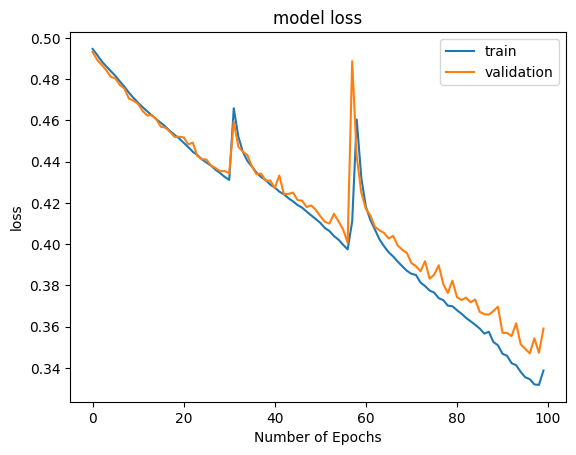

In [72]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('Number of Epochs')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

**Looking at the learning curve aboe we can see that the model loss was good, and it indicated that there was no overfitting in the process having the training loss equal 0.2531 and the validation loss equal 0.2706**

**Model Testing**

**In this block we test the model to see its performance <br>First, we have to encode the words that will be tested to perform the testing and then decoding it back to characters to see the word as an output**

In [73]:
encoder_model = Model(encoder_inputs,encoder_states)

decoder_state_input_h = Input(shape=(latent_dim,))
decoder_state_input_c = Input(shape=(latent_dim,))
decoder_states_inputs = [decoder_state_input_h,decoder_state_input_c]
decoder_outputs,state_h,state_c = decoder_lstm(decoder_inputs,initial_state = decoder_states_inputs)
decoder_states = [state_h,state_c]
decoder_outputs = decoder_dense(decoder_outputs)
decoder_model = Model([decoder_inputs] + decoder_states_inputs, [decoder_outputs] + decoder_states)


def decode_sequence(input_seq):
    # Encode the input as state vectors.
    states_value = encoder_model.predict(input_seq)

    # Generate empty target sequence of length 1.
    target_seq = np.zeros((1, 1, num_dec_tokens))

    # Populate the first character of target sequence with the start character.
    target_seq[0, 0, char2int['\t']] = 1.

    # Sampling loop for a batch of sequences
    # (to simplify, here we assume a batch of size 1).
    stop_condition = False
    decoded_sentence = ''
    while not stop_condition:
        output_tokens, h, c = decoder_model.predict(
            [target_seq] + states_value)

        # Sample a token
        sampled_token_index = np.argmax(output_tokens[0, -1, :])
        sampled_char = int2char[sampled_token_index]
        decoded_sentence += sampled_char

        # Exit condition: either hit max length
        # or find stop character.
        if (sampled_char == '\n' or len(decoded_sentence) > max_dec_len):
            stop_condition = True

        # Update the target sequence (of length 1).
        target_seq = np.zeros((1, 1, num_dec_tokens))
        target_seq[0, 0, sampled_token_index] = 1.

        # Update states
        states_value = [h, c]

    return decoded_sentence

for seq_index in range(60,70):
    input_seq = encoder_input_data[seq_index: seq_index + 1]
    decoded_sentence = decode_sequence(input_seq)
    print('-')
    print('Wrong sentence:', input_texts[seq_index])
    print('Corrected sentence:', decoded_sentence)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━

**So After testing the model; it turns out it works just fine as we can see from the test cases. But, there is a lot of room of improvements; like generalizing the model more to encounter sentences, making the encoder and decoder vectors in a more advanced way, and incresing the number of data and words to make it more general as these are not enough. One improvement that can be applied to make this model more powerful and be able to correct context aware/ sentences is making it bi-directional LSTM or creating a hypird model like BERT-LSTM, and LSTM-LSTM; by making such improvment will enable this model to process better and perform better as well as making it more generalized.**